## SCRAPING THE LIST OF AIR ACCIDENTS & INCIDENTS DATA FROM WIKIPEDIA

## STEP - I: IMPORTING THE NECESSARY LIBRARIES

In [232]:
import numpy as np
from numpy import median
import pandas as pd
import requests
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
from sklearn.preprocessing import LabelEncoder

## STEP - II: ACCESSING THE HTML CONTENT FROM WEBPAGE

In [2]:
URL = 'https://en.wikipedia.org/wiki/List_of_aircraft_accidents_and_incidents_resulting_in_at_least_50_fatalities'

In [3]:
page = requests.get(URL)

In [4]:
page.status_code

200

In [5]:
htmlCode = page.text

In [6]:
htmlCode

'<!DOCTYPE html>\n<html class="client-nojs" lang="en" dir="ltr">\n<head>\n<meta charset="UTF-8"/>\n<title>List of aircraft accidents and incidents resulting in at least 50 fatalities - Wikipedia</title>\n<script>document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"X93i8wpAMMUAAZIiXo4AAACK","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"List_of_aircraft_accidents_and_incidents_resulting_in_at_least_50_fatalities","wgTitle":"List of aircraft accidents and incidents resulting in at least 50 fatalities","wgCurRevisionId":995089911,"wgRevisionId":995089911,"wgArticleId":39587099,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"w

## STEP - III: PARSING THE HTML CONTENT

In [7]:
soup = BeautifulSoup(htmlCode)

In [8]:
soup

<!DOCTYPE html>
<html class="client-nojs" dir="ltr" lang="en">
<head>
<meta charset="utf-8"/>
<title>List of aircraft accidents and incidents resulting in at least 50 fatalities - Wikipedia</title>
<script>document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"X93i8wpAMMUAAZIiXo4AAACK","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"List_of_aircraft_accidents_and_incidents_resulting_in_at_least_50_fatalities","wgTitle":"List of aircraft accidents and incidents resulting in at least 50 fatalities","wgCurRevisionId":995089911,"wgRevisionId":995089911,"wgArticleId":39587099,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGroups":["*"],"wgCateg

## Prettify arranges all the tags in a parse-tree manner with better readability.

In [9]:
print(soup.prettify())

<!DOCTYPE html>
<html class="client-nojs" dir="ltr" lang="en">
 <head>
  <meta charset="utf-8"/>
  <title>
   List of aircraft accidents and incidents resulting in at least 50 fatalities - Wikipedia
  </title>
  <script>
   document.documentElement.className="client-js";RLCONF={"wgBreakFrames":!1,"wgSeparatorTransformTable":["",""],"wgDigitTransformTable":["",""],"wgDefaultDateFormat":"dmy","wgMonthNames":["","January","February","March","April","May","June","July","August","September","October","November","December"],"wgRequestId":"X93i8wpAMMUAAZIiXo4AAACK","wgCSPNonce":!1,"wgCanonicalNamespace":"","wgCanonicalSpecialPageName":!1,"wgNamespaceNumber":0,"wgPageName":"List_of_aircraft_accidents_and_incidents_resulting_in_at_least_50_fatalities","wgTitle":"List of aircraft accidents and incidents resulting in at least 50 fatalities","wgCurRevisionId":995089911,"wgRevisionId":995089911,"wgArticleId":39587099,"wgIsArticle":!0,"wgIsRedirect":!1,"wgAction":"view","wgUserName":null,"wgUserGrou

## STEP - IV:  EXTRACT THE TABLES FROM THE URL

In [10]:
all_tables = soup.find_all('table')

## STEP - V: SELECT THE REQUIRED TABLE FROM ALL ACQUIRED TABLES

In [11]:
my_table = soup.find('table', {'class':'wikitable sortable'})

## STEP - VI: SCRAPING THE DATA FROM WIKIPEDIA

In [12]:
# Create 5 lists for each column
A1 = []
A2 = []
A3 = []
A4 = []
A5 = []

# Extract data using HTML tags and append to each list
for row1 in my_table.find_all('tr'):
    cells1 = row1.find_all('th')
    if len(cells1)== 5:
        A1.append(cells1[0].find(text = True))
        A2.append(cells1[1].find(text = True))
        A3.append(cells1[2].find(text = True))
        A4.append(cells1[3].find(text = True))
        A5.append(cells1[4].find(text = True))

# Create a zipped list of the above lists
zippedlist1 = list(zip(A1,A2,A3,A4,A5))

# Convert zipped list to a data frame
df1 = pd.DataFrame(zippedlist1)

# Make the first row of the data frame as column headers
headers1 = df1.iloc[0]
df2 = pd.DataFrame(df1.values[1:], columns = headers1)

In [13]:
# Extract headers from remaining columns
headers2 = [a.get_text() for a in my_table.find_all('th',{'rowspan':'2'})]

#Create 8 lists for each column 
B1 = []
B2 = []
B3 = []
B4 = []
B5 = []
B6 = []
B7 = []
B8 = []

# Extract data using HTML tags and append to each list
for row2 in my_table.find_all('tr'):
    cells2 = row2.find_all('td')
    if len(cells2)== 8:
        B1.append(cells2[0].find(text = True))
        B2.append(cells2[1].find(text = True))
        B3.append(cells2[2].find(text = True))
        B4.append(cells2[3].find(text = True))
        B5.append(cells2[4].find(text = True))
        B6.append(cells2[5].find(text = True))
        B7.append(cells2[6].find(text = True))
        B8.append(cells2[7].find(text = True))

# Create a zipped list of all the above lists
zippedlist2 = list(zip(B1, B2, B3, B4, B5, B6, B7, B8))

# Convert zipped list to a data frame
df3 = pd.DataFrame(zippedlist2, columns = headers2)

## STEP - VII: CONCATENATE THE TWO DATAFRAMES ALONG THE COLUMNS

## Axis = 1 --> Code will calculate a mean for each row with numeric values in the DataFrame

In [14]:
DF = pd.concat([df2, df3], axis = 1)

## STEP - VIII: VIEW OF FINAL DATA FRAME

In [15]:
DF

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,"est. 1,700",11,81,"est. 1,600",†\n,INH\n,American Airlines Flight 11,Boeing 767-223ER,usnewyne,ENR,\n,\n,2001-09-11
1,"est. 1,000",9,56,est. 900,†\n,INH\n,United Airlines Flight 175,Boeing 767-222,usnewyne,ENR,\n,\n,2001-09-11
2,583,23,560,0,\n,COM\n,Pan Am Flight 1736 and,Boeing 747-121,spct,TXI/TOF,TFN,\n,1977-03-27\n
3,520,15,505,0,\n,COM\n,Japan Airlines Flight 123,Boeing 747SR-46,ju,ENR,\n,\n,1985-08-12\n
4,349,33,316,0,†\n,COM\n,Saudi Arabian Flight 763 and,Boeing 747-168B,indic,ENR,\n,\n,1996-11-12\n
...,...,...,...,...,...,...,...,...,...,...,...,...,...
547,50,5,45,0,†\n,COM\n,Scottish Airlines (G-ANSY),Avro York,maltz,ENR,\n,\n,1956-02-18\n
548,50,9,41,0,†\n,COM\n,Pan Am Flight 202,Boeing 377-10-26,brsan,ENR,\n,\n,1952-04-29\n
549,50,6,44,0,†\n,COM\n,United Airlines Flight 615,Douglas DC-6B,uscau,APR,OAK,22 km,1951-08-24\n
550,50,5,45,0,†\n,COM\n,United Airlines Flight 610,Douglas DC-6,usco,ENR,\n,\n,1951-06-30\n


## STEP - IX: USING REGULAR EXPRESSIONS TO REMOVE PRE-DEFINED CHARACTER CLASSES

In [17]:
DF = DF.replace('\n','', regex=True)

In [18]:
DF

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,"est. 1,700",11,81,"est. 1,600",†,INH,American Airlines Flight 11,Boeing 767-223ER,usnewyne,ENR,,,2001-09-11
1,"est. 1,000",9,56,est. 900,†,INH,United Airlines Flight 175,Boeing 767-222,usnewyne,ENR,,,2001-09-11
2,583,23,560,0,,COM,Pan Am Flight 1736 and,Boeing 747-121,spct,TXI/TOF,TFN,,1977-03-27
3,520,15,505,0,,COM,Japan Airlines Flight 123,Boeing 747SR-46,ju,ENR,,,1985-08-12
4,349,33,316,0,†,COM,Saudi Arabian Flight 763 and,Boeing 747-168B,indic,ENR,,,1996-11-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
547,50,5,45,0,†,COM,Scottish Airlines (G-ANSY),Avro York,maltz,ENR,,,1956-02-18
548,50,9,41,0,†,COM,Pan Am Flight 202,Boeing 377-10-26,brsan,ENR,,,1952-04-29
549,50,6,44,0,†,COM,United Airlines Flight 615,Douglas DC-6B,uscau,APR,OAK,22 km,1951-08-24
550,50,5,45,0,†,COM,United Airlines Flight 610,Douglas DC-6,usco,ENR,,,1951-06-30


## STEP - IX: EXPORT DATAFRAME TO EXCEL

In [19]:
DF.to_excel('E:\Aircraft_Accidents.xlsx')

## STEP - X: FILLING THE NULL VALUES (NaN/NA)

In [20]:
DataFrame = DF
DataFrame = DataFrame.fillna(method='pad')
DataFrame

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,"est. 1,700",11,81,"est. 1,600",†,INH,American Airlines Flight 11,Boeing 767-223ER,usnewyne,ENR,,,2001-09-11
1,"est. 1,000",9,56,est. 900,†,INH,United Airlines Flight 175,Boeing 767-222,usnewyne,ENR,,,2001-09-11
2,583,23,560,0,,COM,Pan Am Flight 1736 and,Boeing 747-121,spct,TXI/TOF,TFN,,1977-03-27
3,520,15,505,0,,COM,Japan Airlines Flight 123,Boeing 747SR-46,ju,ENR,,,1985-08-12
4,349,33,316,0,†,COM,Saudi Arabian Flight 763 and,Boeing 747-168B,indic,ENR,,,1996-11-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...
547,50,5,45,0,†,COM,Scottish Airlines (G-ANSY),Avro York,maltz,ENR,,,1956-02-18
548,50,9,41,0,†,COM,Pan Am Flight 202,Boeing 377-10-26,brsan,ENR,,,1952-04-29
549,50,6,44,0,†,COM,United Airlines Flight 615,Douglas DC-6B,uscau,APR,OAK,22 km,1951-08-24
550,50,5,45,0,†,COM,United Airlines Flight 610,Douglas DC-6,usco,ENR,,,1951-06-30


In [21]:
DataFrame.isnull().sum()

Tot                 0
C                   0
P                   0
G                   0
N                   0
T\n                 0
Incident[nb 1]\n    0
Aircraft\n          0
Location\n          0
Phase\n             0
Airport\n           0
Distance\n          0
Date\n              0
dtype: int64

In [22]:
y = len(DataFrame.columns)

In [23]:
y

13

## STEP - XI: ENCODING THE CATEGORICAL FEATURES INTO NUMERICAL VALUES

In [24]:
Data = DataFrame

## LabelEncoder Encode target labels with value between 0 and n_classes-1.

In [25]:
lb_make=LabelEncoder()
for i in range(y):
    Data[DataFrame.columns[i]]=lb_make.fit_transform(Data[DataFrame.columns[i]])
    i+=1
    print('its done')

its done
its done
its done
its done
its done
its done
its done
its done
its done
its done
its done
its done
its done


In [26]:
Data

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,153,3,136,35,3,4,127,150,453,3,0,0,466
1,152,25,110,36,3,4,511,149,453,3,0,0,466
2,110,15,111,0,0,0,374,134,359,12,199,0,249
3,103,7,104,0,0,0,295,145,233,3,0,0,320
4,99,18,90,0,3,0,414,137,183,3,0,0,430
...,...,...,...,...,...,...,...,...,...,...,...,...,...
547,100,21,98,0,3,0,416,40,246,3,0,0,34
548,100,25,94,0,3,0,375,43,70,3,0,0,25
549,100,22,97,0,3,0,516,197,421,0,149,50,22
550,100,21,98,0,3,0,515,195,422,3,0,0,21


In [27]:
Data.columns

Index(['Tot', 'C', 'P', 'G', 'N', 'T\n', 'Incident[nb 1]\n', 'Aircraft\n',
       'Location\n', 'Phase\n', 'Airport\n', 'Distance\n', 'Date\n'],
      dtype='object')

## STEP - XII: DATA VISUALIZATION

In [28]:
DF.describe()

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
count,552,552,552,552,552,552,552,552,552,552,552,552,552
unique,154,34,162,37,4,6,544,339,485,16,227,120,549
top,50,6,55,0,†,COM,Afghanistan Air Force,Tupolev Tu-154M,usnewyne,ENR,,,2001-09-11
freq,24,83,16,484,383,441,3,11,5,249,265,309,3


In [29]:
DF.shape

(552, 13)

In [30]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 552 entries, 0 to 551
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Tot              552 non-null    object
 1   C                552 non-null    object
 2   P                552 non-null    object
 3   G                552 non-null    object
 4   N                552 non-null    object
 5   T
               552 non-null    object
 6   Incident[nb 1]
  552 non-null    object
 7   Aircraft
        552 non-null    object
 8   Location
        552 non-null    object
 9   Phase
           552 non-null    object
 10  Airport
         552 non-null    object
 11  Distance
        552 non-null    object
 12  Date
            552 non-null    object
dtypes: object(13)
memory usage: 56.2+ KB


In [31]:
DF.isnull().sum()

Tot                 0
C                   0
P                   0
G                   0
N                   0
T\n                 0
Incident[nb 1]\n    0
Aircraft\n          0
Location\n          0
Phase\n             0
Airport\n           0
Distance\n          0
Date\n              0
dtype: int64

In [32]:
Data.describe()

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
count,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000,552.000000
mean,90.704710,17.664855,90.824275,1.815217,2.128623,0.817029,271.936594,186.257246,243.280797,2.831522,57.804348,25.695652,274.885870
std,44.196165,8.027516,45.440653,6.050176,1.329457,1.746409,157.303380,101.887019,139.629530,2.857579,73.071564,35.865874,158.677439
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,53.750000,14.750000,51.000000,0.000000,0.000000,0.000000,135.750000,95.000000,123.000000,0.000000,0.000000,0.000000,137.750000
50%,105.500000,21.000000,105.000000,0.000000,3.000000,0.000000,272.500000,197.000000,242.500000,3.000000,7.000000,0.000000,275.500000
75%,124.250000,23.000000,125.000000,0.000000,3.000000,0.000000,408.250000,275.250000,363.250000,3.000000,114.250000,48.250000,412.250000
max,153.000000,33.000000,161.000000,36.000000,3.000000,5.000000,543.000000,338.000000,484.000000,15.000000,226.000000,119.000000,548.000000


In [33]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 552 entries, 0 to 551
Data columns (total 13 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   Tot              552 non-null    int32
 1   C                552 non-null    int32
 2   P                552 non-null    int32
 3   G                552 non-null    int32
 4   N                552 non-null    int32
 5   T
               552 non-null    int32
 6   Incident[nb 1]
  552 non-null    int32
 7   Aircraft
        552 non-null    int32
 8   Location
        552 non-null    int32
 9   Phase
           552 non-null    int32
 10  Airport
         552 non-null    int32
 11  Distance
        552 non-null    int32
 12  Date
            552 non-null    int32
dtypes: int32(13)
memory usage: 28.2 KB


In [34]:
Data['P'].value_counts()

109    16
100    13
103    13
106    13
98     12
       ..
38      1
82      1
83      1
84      1
161     1
Name: P, Length: 162, dtype: int64

In [35]:
Data['C'].value_counts()

22    83
23    69
21    66
24    61
19    52
25    44
3     31
2     28
17    25
4     17
12    14
6     13
0      7
1      7
5      6
7      5
15     3
11     3
8      2
10     2
9      1
33     1
13     1
14     1
32     1
18     1
20     1
26     1
27     1
28     1
29     1
30     1
31     1
16     1
Name: C, dtype: int64

In [36]:
Data['Tot'].value_counts()

100    24
102    17
104    14
109    13
113    12
       ..
74      1
75      1
152     1
77      1
76      1
Name: Tot, Length: 154, dtype: int64

In [37]:
Data['Aircraft\n'].value_counts()

321    11
194    10
284    10
241     9
197     8
       ..
189     1
187     1
184     1
182     1
0       1
Name: Aircraft\n, Length: 339, dtype: int64

In [38]:
Data['Incident[nb 1]\n'].value_counts()

75     3
287    2
224    2
542    2
442    2
      ..
367    1
368    1
369    1
370    1
0      1
Name: Incident[nb 1]\n, Length: 544, dtype: int64

In [39]:
Data['Airport\n'].value_counts()

0      265
1        4
88       4
124      3
199      3
      ... 
120      1
196      1
118      1
117      1
226      1
Name: Airport\n, Length: 227, dtype: int64

In [40]:
print("Maximum: ", Data["P"].max())

Maximum:  161


In [41]:
print("Maximum: ", Data["T\n"].max())
print("Minimum: ", Data["T\n"].min())

Maximum:  5
Minimum:  0


In [42]:
print("Maximum: ", Data["Incident[nb 1]\n"].max())
print("Minimum: ", Data["Incident[nb 1]\n"].min())

Maximum:  543
Minimum:  0


In [43]:
Data[Data['Aircraft\n'] == Data['Aircraft\n'].max()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
401,115,24,109,0,3,0,520,338,188,0,21,28,89


In [44]:
Data[Data['Aircraft\n'] == Data['Aircraft\n'].min()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
477,105,21,102,0,3,0,479,0,95,3,0,0,533


In [45]:
Data[Data['Incident[nb 1]\n'] == Data['Incident[nb 1]\n'].max()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
123,26,3,17,0,0,0,543,242,380,0,46,37,227


In [46]:
Data[Data['Incident[nb 1]\n'] == Data['Incident[nb 1]\n'].min()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
383,118,3,109,0,3,5,0,215,163,8,0,0,32


In [47]:
Data[Data['Location\n'] == Data['Location\n'].max()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
257,137,19,136,0,3,5,494,216,484,3,0,0,112


In [48]:
Data[Data['Location\n'] == Data['Location\n'].min()]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
507,102,22,99,0,3,3,175,197,0,3,0,0,108


In [49]:
Data.loc[Data.P > 100, :]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,153,3,136,35,3,4,127,150,453,3,0,0,466
1,152,25,110,36,3,4,511,149,453,3,0,0,466
2,110,15,111,0,0,0,374,134,359,12,199,0,249
3,103,7,104,0,0,0,295,145,233,3,0,0,320
37,69,22,113,6,3,4,132,147,463,3,0,0,466
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,102,17,102,0,3,1,434,166,368,0,98,119,409
506,102,19,101,0,3,0,60,31,402,0,217,101,174
511,102,17,102,0,0,0,478,197,138,0,29,56,35
513,102,0,106,0,0,0,378,194,458,3,0,0,24


In [50]:
Data.loc[Data.P < 50, :]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
20,84,12,0,13,0,0,77,36,126,5,146,11,419
55,58,4,49,0,3,0,366,4,261,0,105,48,382
58,56,23,49,0,3,0,270,15,193,3,0,0,530
59,56,23,49,0,1,0,122,73,229,3,0,0,169
60,55,24,48,0,3,0,535,288,474,3,0,0,490
...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,109,21,0,23,3,0,298,228,113,3,0,0,3
490,104,19,0,19,3,0,72,208,132,10,211,0,308
499,104,1,0,22,3,5,412,184,113,3,0,0,2
510,102,23,30,16,3,5,492,173,168,3,0,0,61


In [51]:
Data.loc[Data.C > 20, :]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
1,152,25,110,36,3,4,511,149,453,3,0,0,466
14,89,25,83,20,3,0,131,6,447,3,0,0,469
19,85,24,81,0,3,0,138,279,80,5,224,41,324
28,77,23,74,0,3,3,345,20,260,3,0,0,534
33,72,25,67,0,3,0,49,320,473,3,0,0,317
...,...,...,...,...,...,...,...,...,...,...,...,...,...
545,100,23,96,0,3,0,383,257,66,3,0,0,84
547,100,21,98,0,3,0,416,40,246,3,0,0,34
548,100,25,94,0,3,0,375,43,70,3,0,0,25
549,100,22,97,0,3,0,516,197,421,0,149,50,22


In [52]:
Data.loc[Data.C < 20, :]

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,153,3,136,35,3,4,127,150,453,3,0,0,466
2,110,15,111,0,0,0,374,134,359,12,199,0,249
3,103,7,104,0,0,0,295,145,233,3,0,0,320
4,99,18,90,0,3,0,414,137,183,3,0,0,430
5,98,3,91,0,3,0,484,272,149,3,0,0,212
...,...,...,...,...,...,...,...,...,...,...,...,...,...
533,100,4,92,0,1,0,524,49,118,0,2,38,334
535,100,17,100,0,0,0,433,273,365,10,8,8,297
538,100,19,99,0,3,0,362,297,176,0,108,40,244
546,100,19,99,0,3,0,177,326,464,3,0,0,52


In [53]:
Data.loc[Data.P > 120, : 'Location\n']

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n
0,153,3,136,35,3,4,127,150,453
73,50,2,129,28,3,0,528,284,476
83,45,21,149,19,0,0,338,103,203
153,13,6,153,0,3,0,468,9,262
176,8,2,152,0,3,0,191,239,87
...,...,...,...,...,...,...,...,...,...
367,120,12,121,0,0,0,139,127,353
425,112,30,158,0,3,5,246,293,161
480,105,31,159,0,3,5,224,26,144
489,104,32,160,0,0,1,158,34,20


In [54]:
Data.loc[Data.P < 100, : 'Aircraft\n']

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n
4,99,18,90,0,3,0,414,137
5,98,3,91,0,3,0,484,272
6,97,14,89,0,3,3,99,140
7,96,6,88,0,3,0,415,259
8,95,7,87,0,3,1,333,155
...,...,...,...,...,...,...,...,...
546,100,19,99,0,3,0,177,326
547,100,21,98,0,3,0,416,40
548,100,25,94,0,3,0,375,43
549,100,22,97,0,3,0,516,197


In [55]:
Data.loc[(Data.P > 150) & (Data.C > 20), ['Tot']]

,Tot
183,7
186,6
187,5
188,4
189,4
190,4
196,2
204,151
288,132
334,125


In [56]:
Data.loc[(Data.P < 150) & (Data.C > 10), ['T\n']]

,T\n
1,4
2,0
4,0
6,3
13,2
...,...
547,0
548,0
549,0
550,0


In [57]:
Data.mean()

Tot                  90.704710
C                    17.664855
P                    90.824275
G                     1.815217
N                     2.128623
T\n                   0.817029
Incident[nb 1]\n    271.936594
Aircraft\n          186.257246
Location\n          243.280797
Phase\n               2.831522
Airport\n            57.804348
Distance\n           25.695652
Date\n              274.885870
dtype: float64

In [58]:
Data.median()

Tot                 105.5
C                    21.0
P                   105.0
G                     0.0
N                     3.0
T\n                   0.0
Incident[nb 1]\n    272.5
Aircraft\n          197.0
Location\n          242.5
Phase\n               3.0
Airport\n             7.0
Distance\n            0.0
Date\n              275.5
dtype: float64

In [59]:
Data.std()

Tot                  44.196165
C                     8.027516
P                    45.440653
G                     6.050176
N                     1.329457
T\n                   1.746409
Incident[nb 1]\n    157.303380
Aircraft\n          101.887019
Location\n          139.629530
Phase\n               2.857579
Airport\n            73.071564
Distance\n           35.865874
Date\n              158.677439
dtype: float64

In [60]:
Data.var()

Tot                  1953.301030
C                      64.441013
P                    2064.852912
G                      36.604632
N                       1.767455
T\n                     3.049945
Incident[nb 1]\n    24744.353504
Aircraft\n          10380.964557
Location\n          19496.405583
Phase\n                 8.165756
Airport\n            5339.453484
Distance\n           1286.360925
Date\n              25178.529600
dtype: float64

In [61]:
Data.max()

Tot                 153
C                    33
P                   161
G                    36
N                     3
T\n                   5
Incident[nb 1]\n    543
Aircraft\n          338
Location\n          484
Phase\n              15
Airport\n           226
Distance\n          119
Date\n              548
dtype: int32

In [62]:
Data.head()

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,153,3,136,35,3,4,127,150,453,3,0,0,466
1,152,25,110,36,3,4,511,149,453,3,0,0,466
2,110,15,111,0,0,0,374,134,359,12,199,0,249
3,103,7,104,0,0,0,295,145,233,3,0,0,320
4,99,18,90,0,3,0,414,137,183,3,0,0,430


In [63]:
Data.tail()

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
547,100,21,98,0,3,0,416,40,246,3,0,0,34
548,100,25,94,0,3,0,375,43,70,3,0,0,25
549,100,22,97,0,3,0,516,197,421,0,149,50,22
550,100,21,98,0,3,0,515,195,422,3,0,0,21
551,100,17,100,0,3,0,387,188,470,3,0,0,10


In [64]:
Data.to_excel('E:\Aircraft_Accidents.xlsx')

In [65]:
Data.to_csv('E:\Aircraft_Accidents.csv')

## STEP - XIII: PLOTTING THE DATA STORED IN DATAFRAME

## MATPLOTLIB: It's a Python plotting package that makes it simple to create two-dimensional plots from data stored in a variety of data structures including lists, numpy arrays, and pandas dataframes.This means that plots can be built step-by-step by adding new elements to the plot.

## PLOTLY: It allows users to stream data to be analyzed and visualized.

## PLOTLY EXPRESS: It provides more than 30 functions for creating different types of figures. The API for these functions was carefully designed to be as consistent and easy to learn as possible, making it easy to switch from a scatter plot to a bar chart to a histogram to a sunburst chart throughout a data exploration session.

## SEABORN: It's a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics.

In [66]:
A = DF.head()
A

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
0,"est. 1,700",11,81,"est. 1,600",†,INH,American Airlines Flight 11,Boeing 767-223ER,usnewyne,ENR,,,2001-09-11
1,"est. 1,000",9,56,est. 900,†,INH,United Airlines Flight 175,Boeing 767-222,usnewyne,ENR,,,2001-09-11
2,583,23,560,0,,COM,Pan Am Flight 1736 and,Boeing 747-121,spct,TXI/TOF,TFN,,1977-03-27
3,520,15,505,0,,COM,Japan Airlines Flight 123,Boeing 747SR-46,ju,ENR,,,1985-08-12
4,349,33,316,0,†,COM,Saudi Arabian Flight 763 and,Boeing 747-168B,indic,ENR,,,1996-11-12


In [67]:
B = DF.tail()
B

,Tot,C,P,G,N,T\n,Incident[nb 1]\n,Aircraft\n,Location\n,Phase\n,Airport\n,Distance\n,Date\n
547,50,5,45,0,†,COM,Scottish Airlines (G-ANSY),Avro York,maltz,ENR,,,1956-02-18
548,50,9,41,0,†,COM,Pan Am Flight 202,Boeing 377-10-26,brsan,ENR,,,1952-04-29
549,50,6,44,0,†,COM,United Airlines Flight 615,Douglas DC-6B,uscau,APR,OAK,22 km,1951-08-24
550,50,5,45,0,†,COM,United Airlines Flight 610,Douglas DC-6,usco,ENR,,,1951-06-30
551,50,3,47,0,†,COM,Pennsylvania Central Airlines Flight 410,Douglas C-54 Skymaster,uswess,ENR,,,1947-06-13


## HISTOGRAM - UNIVARIATE ANALYSIS : Representation of the distribution of numerical data, where the data are binned and the count for each bin is represented. In plotly it is an aggregated bar chart, with several possible aggregation functions.

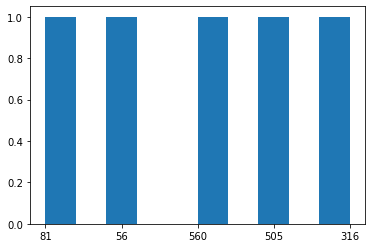

In [68]:
plt.hist(A['P'])
plt.show()

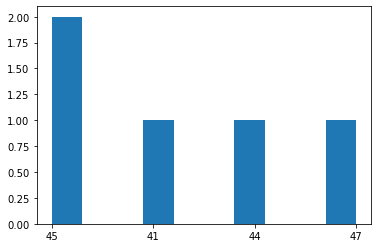

In [69]:
plt.hist(B['P'])
plt.show()

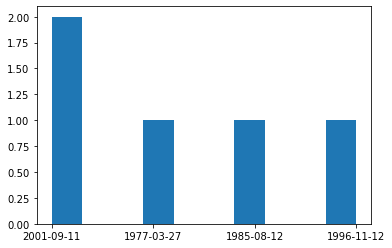

In [70]:
plt.hist(A['Date\n'])
plt.show()

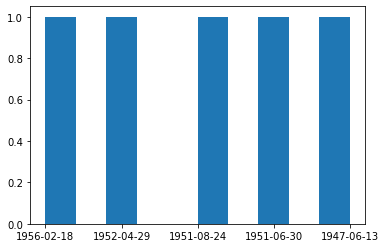

In [71]:
plt.hist(B['Date\n'])
plt.show()

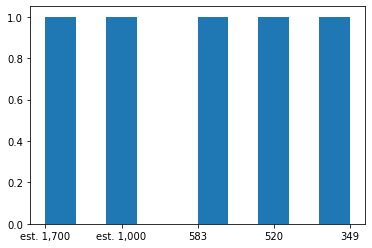

In [233]:
A = DF.head()
plt.hist(A['Tot'])
plt.show()

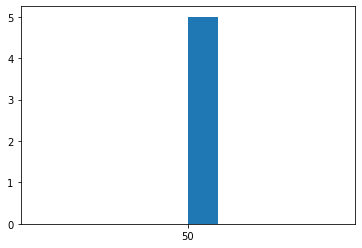

In [234]:
B = DF.tail()
plt.hist(B['Tot'])
plt.show()

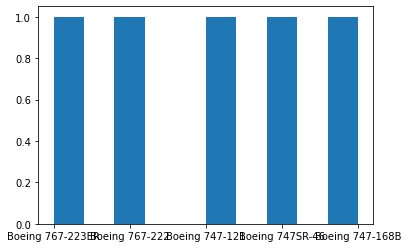

In [235]:
A = DF.head()
plt.hist(A['Aircraft\n'])
plt.show()

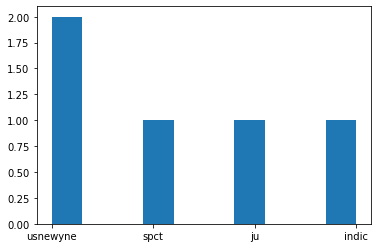

In [236]:
A = DF.head()
plt.hist(A['Location\n'])
plt.show()

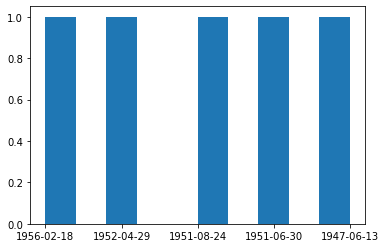

In [237]:
A = DF.tail()
plt.hist(A['Date\n'])
plt.show()

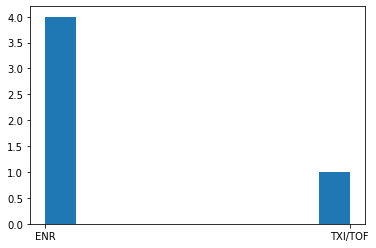

In [72]:
plt.hist(A['Phase\n'])
plt.show()

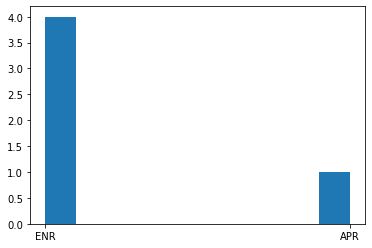

In [73]:
plt.hist(B['Phase\n'])
plt.show()

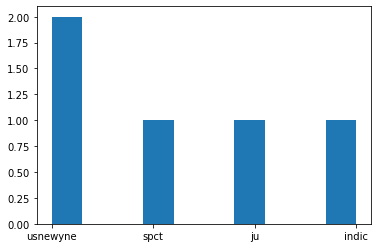

In [74]:
plt.hist(A['Location\n'])
plt.show()

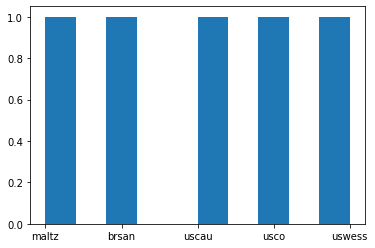

In [75]:
plt.hist(B['Location\n'])
plt.show()

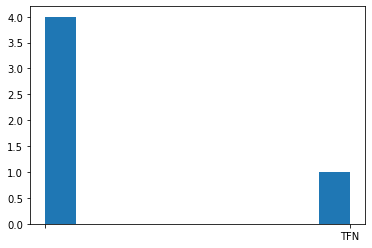

In [76]:
plt.hist(A['Airport\n'])
plt.show()

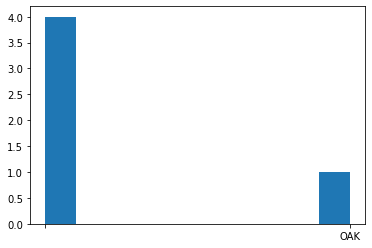

In [77]:
plt.hist(B['Airport\n'])
plt.show()

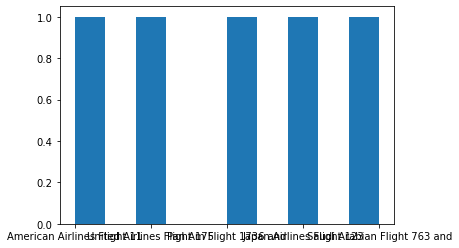

In [78]:
plt.hist(A['Incident[nb 1]\n'])
plt.show()

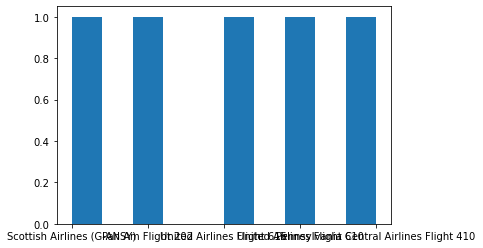

In [79]:
plt.hist(B['Incident[nb 1]\n'])
plt.show()

OBSERVATION: Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C) were dead by Hijacking(T: INH) on En Route(Phase) on 11-09-2001(Date) at New York City, US(Location). 

## DISTPLOT: Plots a Univariate Distribution of observations. 
## The distplot() function combines the matplotlib hist function with the seaborn kdeplot() and rugplot() functions.

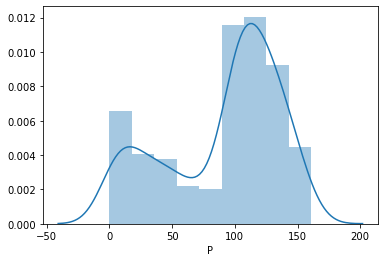

In [80]:
# by default-> sns.distplot(x, hist=True, kde=True)
sns.distplot(Data['P'])

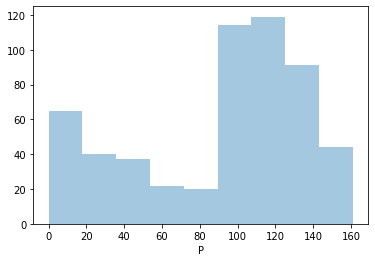

In [81]:
sns.distplot(Data['P'], kde = False, rug = False)

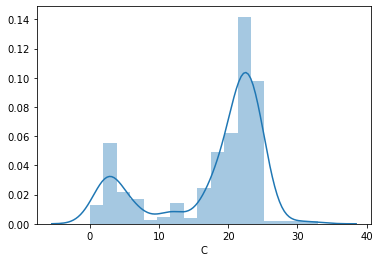

In [82]:
# by default-> sns.distplot(x, hist=True, kde=True)
sns.distplot(Data['C'])

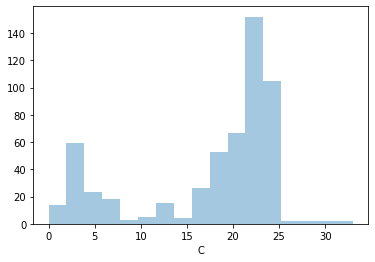

In [83]:
sns.distplot(Data['C'], kde = False, rug = False)

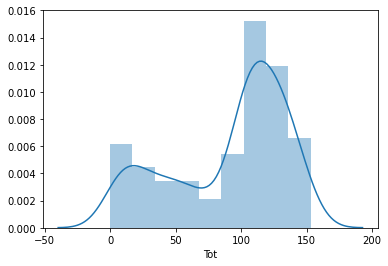

In [84]:
sns.distplot(Data['Tot'])

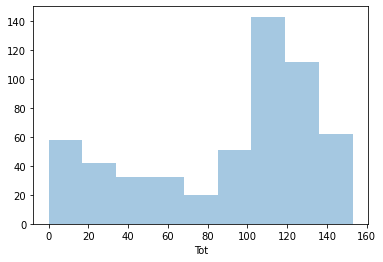

In [85]:
sns.distplot(Data['Tot'], kde = False, rug = False)

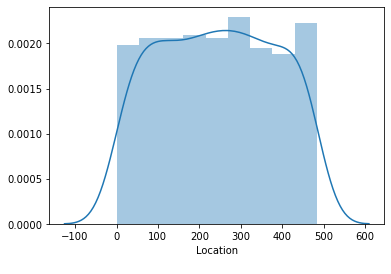

In [98]:
sns.distplot(Data['Location\n'])

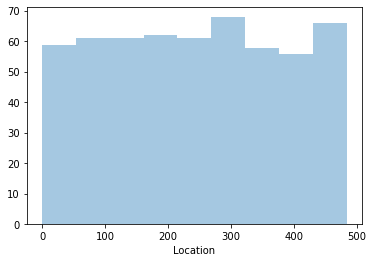

In [87]:
sns.distplot(Data['Location\n'], kde = False, rug = False)

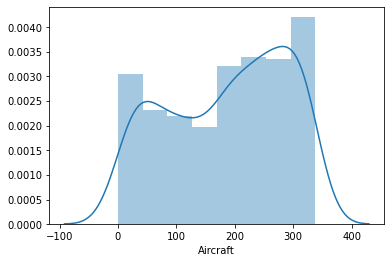

In [88]:
sns.distplot(Data['Aircraft\n'])

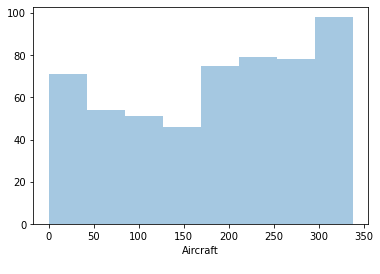

In [89]:
sns.distplot(Data['Aircraft\n'], kde = False, rug = False)

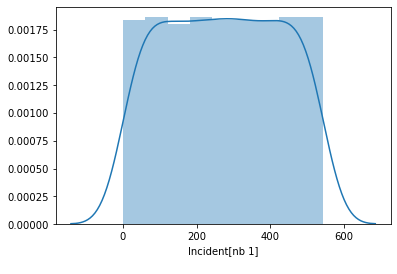

In [91]:
sns.distplot(Data['Incident[nb 1]\n'])

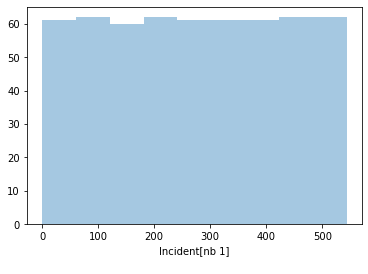

In [92]:
sns.distplot(Data['Incident[nb 1]\n'], kde = False, rug = False)

C:\Users\admin\anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


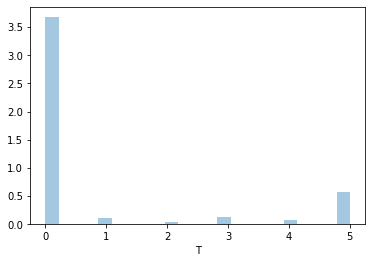

In [93]:
sns.distplot(Data['T\n'])

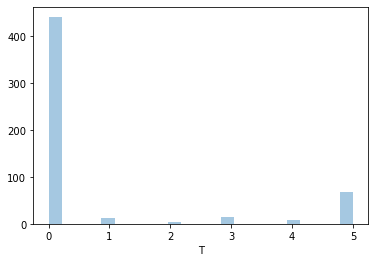

In [94]:
sns.distplot(Data['T\n'], kde = False, rug = False)

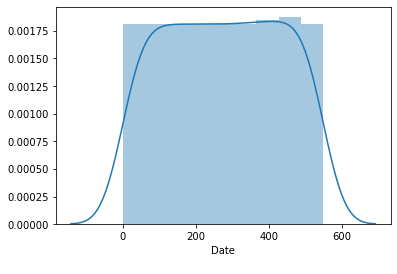

In [95]:
sns.distplot(Data['Date\n'])

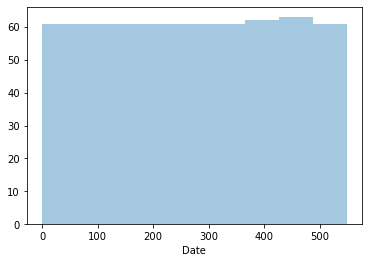

In [96]:
sns.distplot(Data['Date\n'], kde = False, rug = False)

OBSERVATION: Incident is high with Air France Flight, Aircraft:-Boeing 727-230: 43 Passengers(P), 10 Crew(C) were dead by Commercial (T: accident/incident) on En Route(Phase) on 20-4-1998(Date) at Monserrate Mtn, Bogota, Colombia(Location). 

## BOXPLOT - UNIVARIATE ANALYSYS: A measure of how well the distribution of data in a DataFrame. It divides the data set into three quartiles representing the minimum, maximum, median, first quartile and third quartile in the DataFrame.

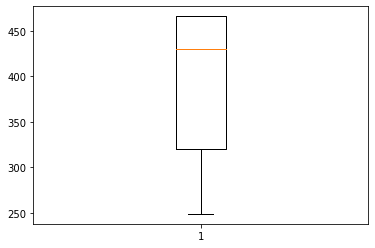

In [99]:
A = Data.head()
plt.boxplot(A['Date\n'])
plt.show()

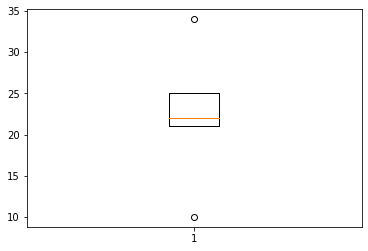

In [100]:
B = Data.tail()
plt.boxplot(B['Date\n'])
plt.show()

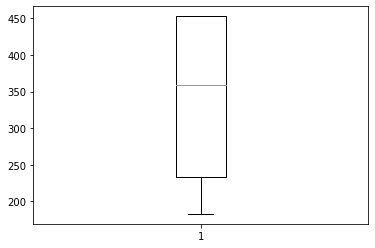

In [101]:
A = Data.head()
plt.boxplot(A['Location\n'])
plt.show()

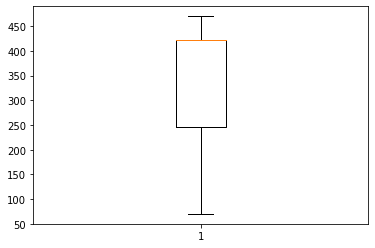

In [102]:
B = Data.tail()
plt.boxplot(B['Location\n'])
plt.show()

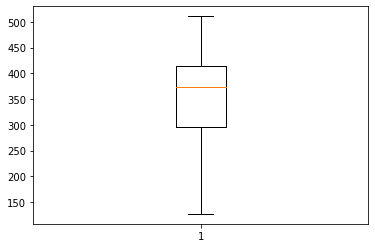

In [103]:
A = Data.head()
plt.boxplot(A['Incident[nb 1]\n'])
plt.show()

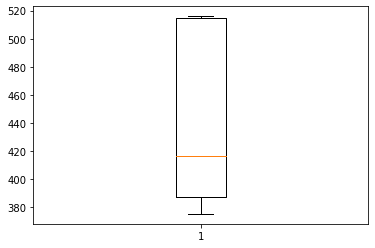

In [104]:
B = Data.tail()
plt.boxplot(B['Incident[nb 1]\n'])
plt.show()

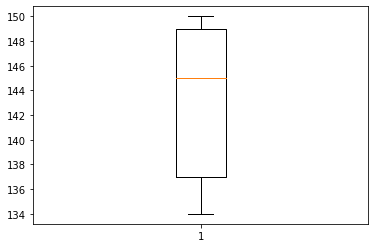

In [106]:
A = Data.head()
plt.boxplot(A['Aircraft\n'])
plt.show()

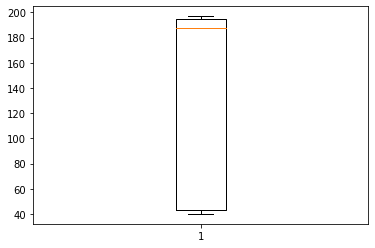

In [107]:
B = Data.tail()
plt.boxplot(B['Aircraft\n'])
plt.show()

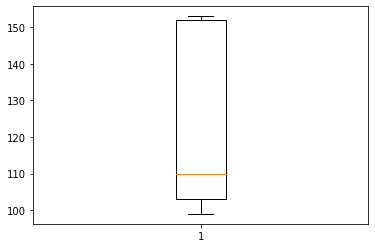

In [108]:
A = Data.head()
plt.boxplot(A['Tot'])
plt.show()

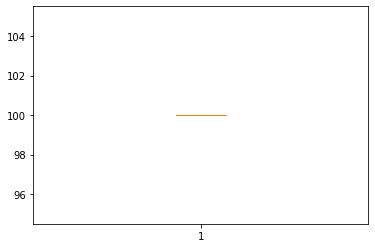

In [109]:
B = Data.tail()
plt.boxplot(B['Tot'])
plt.show()

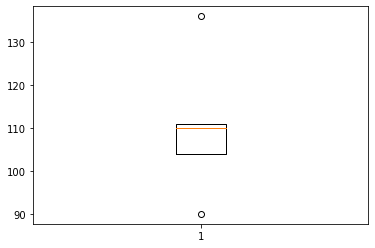

In [110]:
A = Data.head()
plt.boxplot(A['P'])
plt.show()

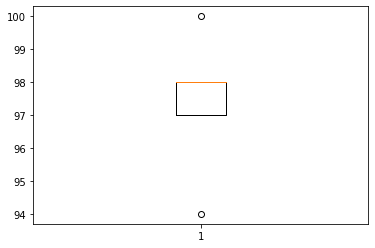

In [112]:
B = Data.tail()
plt.boxplot(B['P'])
plt.show()

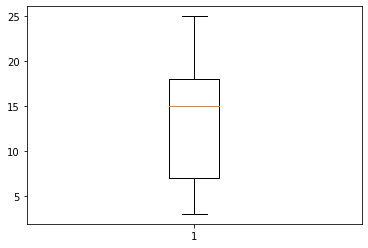

In [113]:
A = Data.head()
plt.boxplot(A['C'])
plt.show()

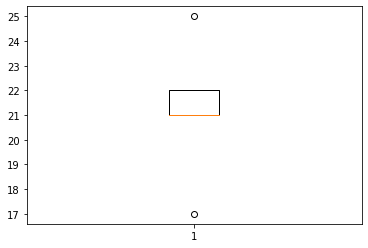

In [114]:
B = Data.tail()
plt.boxplot(B['C'])
plt.show()

OBSERVATION: Incident is high with Trigana Air Flight 267, Aircraft:- ATR 42-300: 49 Passengers(P), 5 Crew(C) were dead by Commercial (T: accident/incident) on En Route(Phase) on 16-8-2015(Date) at Mount Tangok, Pegunungan Bintang Regency, Papua, Indonesia(Location).			

## Seaborn Boxplots are used to visualize distributions. Thats very useful when you want to compare data between two groups. Sometimes named as box-and-whisker plot. Any box shows the quartiles of the dataset while the whiskers extend to show the rest of the distribution.

## BOX PLOT - BIVARIATE ANALYSIS

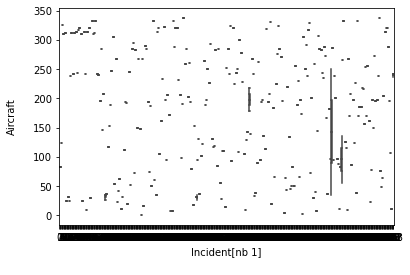

In [115]:
sns.boxplot(x = 'Incident[nb 1]\n', y = 'Aircraft\n', data = Data)

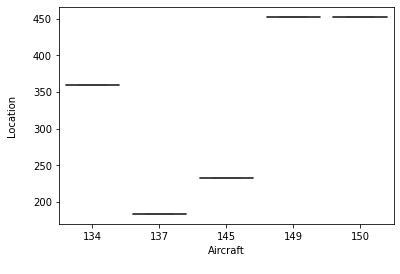

In [116]:
sns.boxplot(x = 'Aircraft\n', y = 'Location\n', data = A)

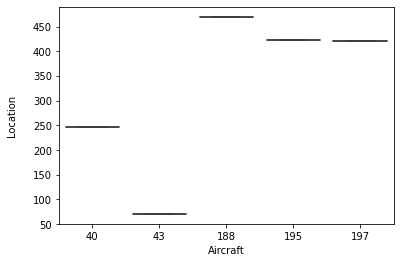

In [117]:
sns.boxplot(x = 'Aircraft\n', y = 'Location\n', data = B)

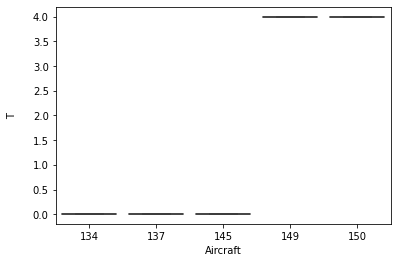

In [118]:
sns.boxplot(x = 'Aircraft\n', y = 'T\n', data = A)

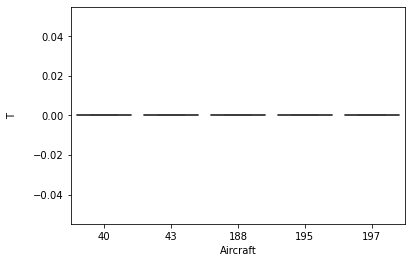

In [119]:
sns.boxplot(x = 'Aircraft\n', y = 'T\n', data = B)

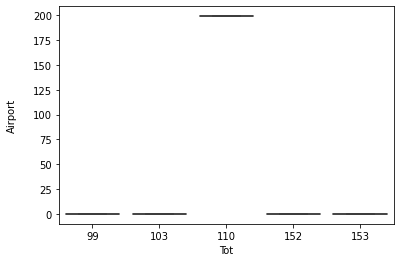

In [120]:
sns.boxplot(x = 'Tot', y = 'Airport\n', data = A)

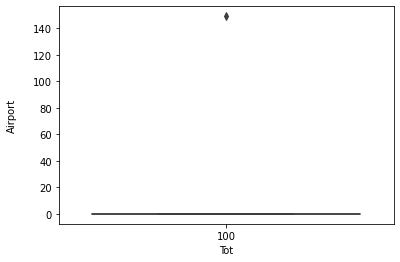

In [123]:
sns.boxplot(x = 'Tot', y = 'Airport\n', data = B)

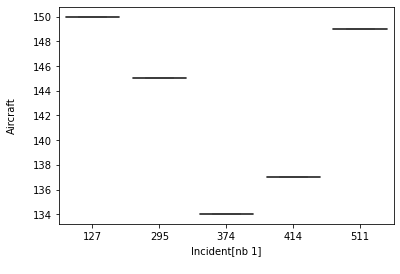

In [122]:
sns.boxplot(x = 'Incident[nb 1]\n', y = 'Aircraft\n', data = A)

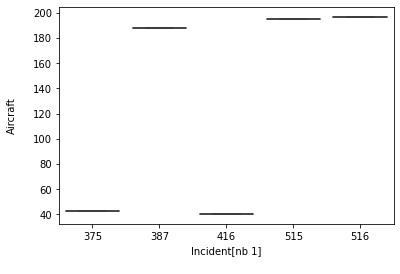

In [124]:
sns.boxplot(x = 'Incident[nb 1]\n', y = 'Aircraft\n', data = B)

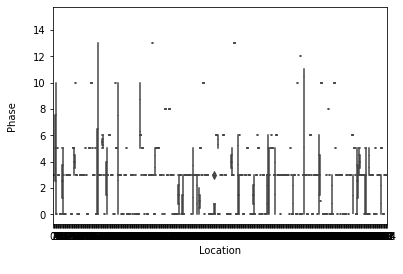

In [125]:
sns.boxplot(x = 'Location\n', y = 'Phase\n', data = Data)

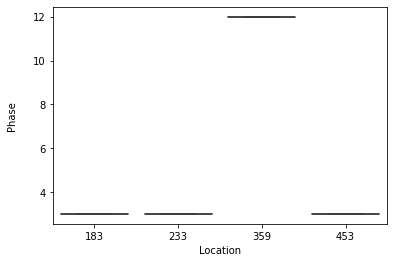

In [126]:
sns.boxplot(x = 'Location\n', y = 'Phase\n', data = A)

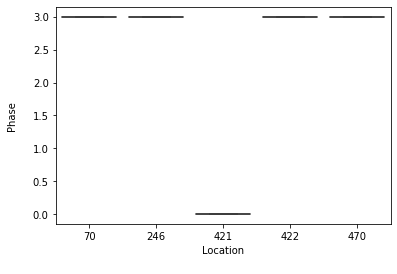

In [127]:
sns.boxplot(x = 'Location\n', y = 'Phase\n', data = B)

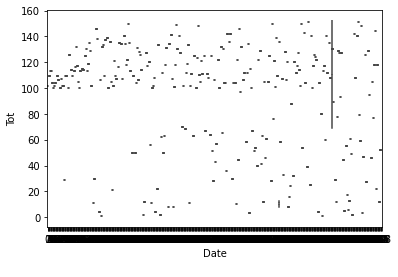

In [128]:
sns.boxplot(x = 'Date\n', y = 'Tot', data = Data)

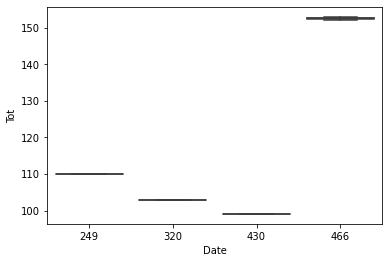

In [129]:
sns.boxplot(x = 'Date\n', y = 'Tot', data = A)

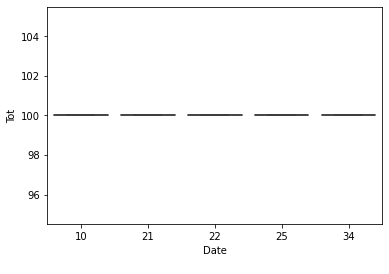

In [130]:
sns.boxplot(x = 'Date\n', y = 'Tot', data = B)

In [131]:
# Box Plot in Plotly Express

px.box(A, x ='Date\n', y = 'Tot')

In [132]:
px.box(B, x ='Date\n', y = 'Tot')

In [133]:
px.box(Data, x ='Phase\n', y = 'P', color = 'C')

In [134]:
px.box(A, x ='Phase\n', y = 'P', color = 'C')

In [135]:
px.box(B, x ='Phase\n', y = 'P', color = 'C')

In [136]:
px.box(Data, x ='Phase\n', y = 'P', color = 'Aircraft\n')

In [137]:
px.box(A, x ='Phase\n', y = 'P', color = 'Aircraft\n')

In [138]:
px.box(B, x ='Phase\n', y = 'P', color = 'Aircraft\n')

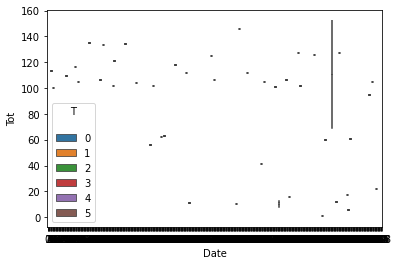

In [139]:
sns.boxplot(x = 'Date\n', y = 'Tot', hue = 'T\n', data = Data)

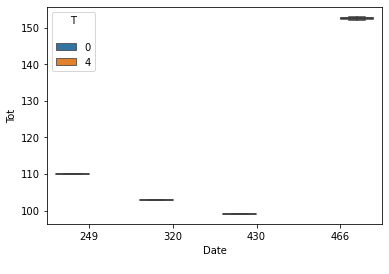

In [140]:
sns.boxplot(x = 'Date\n', y = 'Tot', hue = 'T\n', data = A)

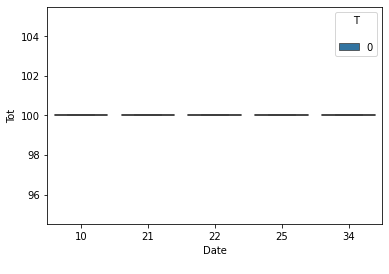

In [141]:
sns.boxplot(x = 'Date\n', y = 'Tot', hue = 'T\n', data = B)

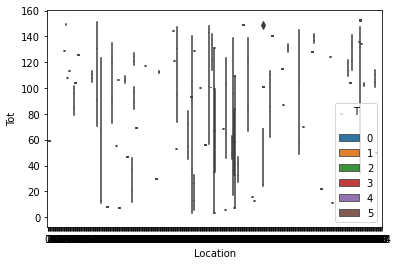

In [142]:
sns.boxplot(data = Data, x = 'Location\n', y = 'Tot', hue = 'T\n')

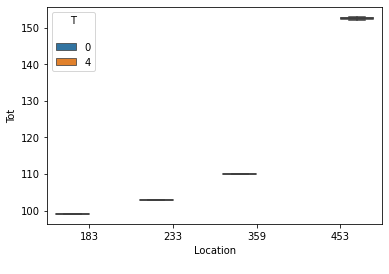

In [143]:
sns.boxplot(data = A, x = 'Location\n', y = 'Tot', hue = 'T\n')

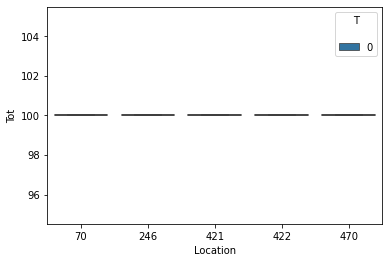

In [144]:
sns.boxplot(data = B, x = 'Location\n', y = 'Tot', hue = 'T\n')

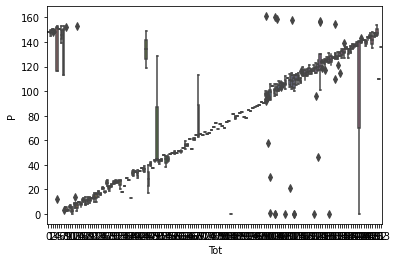

In [361]:
sns.boxplot(data = Data, x ='Tot', y = 'P')

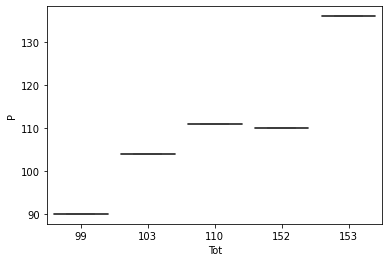

In [362]:
sns.boxplot(data = A, x ='Tot', y = 'P')

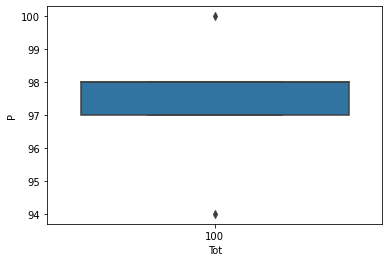

In [363]:
sns.boxplot(data = B, x ='Tot', y = 'P')

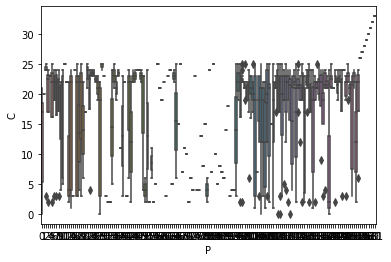

In [364]:
sns.boxplot(data = Data, x ='P', y = 'C')

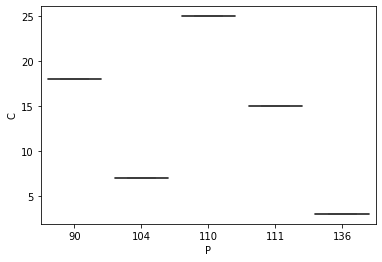

In [365]:
sns.boxplot(data = A, x ='P', y = 'C')

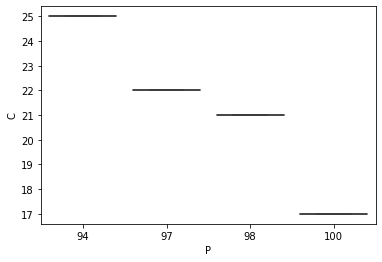

In [366]:
sns.boxplot(data = B, x ='P', y = 'C')

OBSERVATION: Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).	

## JOINT PLOT: Seaborn's jointplot displays a relationship between 2 variables (bivariate) as well as 1D profiles (univariate) in the margins. This plot is a convenience class that wraps JointGrid.

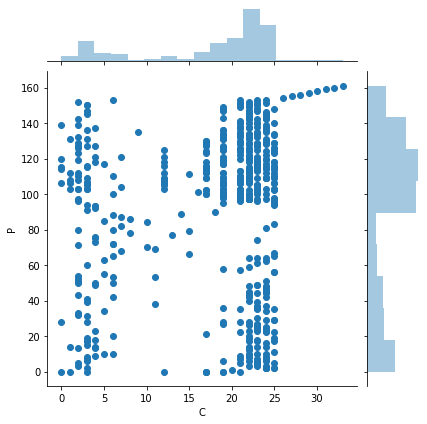

In [145]:
sns.jointplot(x = 'C', y = 'P', data = Data)

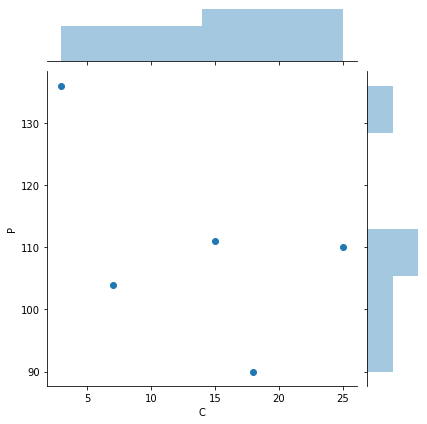

In [146]:
sns.jointplot(x = 'C', y = 'P', data = A)

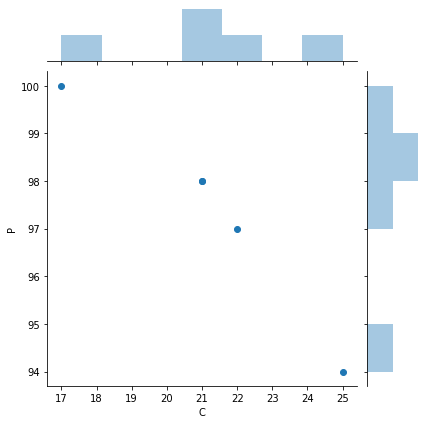

In [147]:
sns.jointplot(x = 'C', y = 'P', data = B)

## SCATTER PLOT: It's a diagram where each value in the DataFrame is represented by a dot. The Matplotlib module has a method for drawing scatter plots, it needs two arrays of the same length, one for the values of the x-axis, and one for the values of the y-axis

In [148]:
px.scatter(A, x = 'Incident[nb 1]\n', y = 'Aircraft\n')

In [149]:
px.scatter(B, x = 'Incident[nb 1]\n', y = 'Aircraft\n')

In [150]:
px.scatter(A, x = 'Phase\n', y = 'Airport\n')

In [151]:
px.scatter(B, x = 'Phase\n', y = 'Airport\n')

In [152]:
px.scatter(A, x = 'Date\n', y = 'Location\n')

In [153]:
px.scatter(B, x = 'Date\n', y = 'Location\n')

In [154]:
px.scatter(Data, x = 'C', y = 'P')

In [155]:
px.scatter(A, x = 'C', y = 'P')

In [156]:
px.scatter(B, x = 'C', y = 'P')

In [157]:
# Scatter Plot with OLS line

px.scatter(Data, x = 'C', y = 'P', trendline = 'ols')

In [158]:
px.scatter(A, x = 'C', y = 'P', trendline = 'ols')

In [159]:
px.scatter(B, x = 'C', y = 'P', trendline = 'ols')

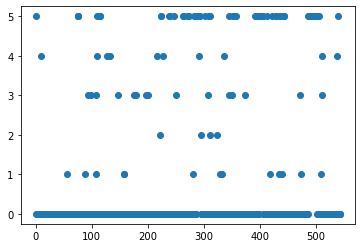

In [238]:
plt.scatter(Data['Incident[nb 1]\n'], Data['T\n'])
plt.show()

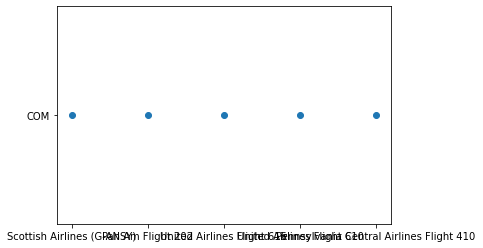

In [239]:
plt.scatter(A['Incident[nb 1]\n'], A['T\n'])
plt.show()

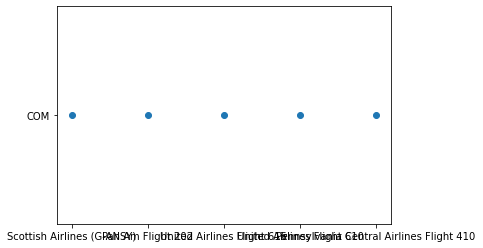

In [240]:
plt.scatter(B['Incident[nb 1]\n'], B['T\n'])
plt.show()

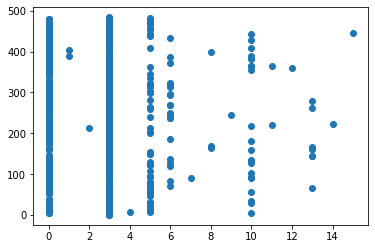

In [241]:
plt.scatter(Data['Phase\n'], Data['Location\n'])
plt.show()

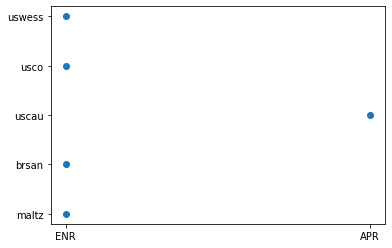

In [242]:
plt.scatter(A['Phase\n'], A['Location\n'])
plt.show()

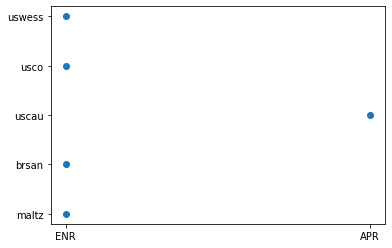

In [243]:
plt.scatter(B['Phase\n'], B['Location\n'])
plt.show()

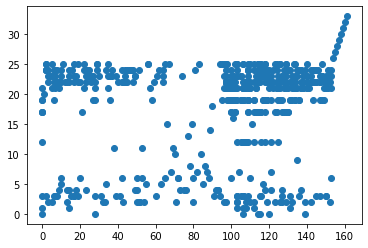

In [244]:
plt.scatter(Data['P'], Data['C'])
plt.show()

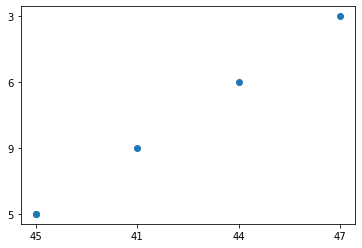

In [245]:
plt.scatter(A['P'], A['C'])
plt.show()

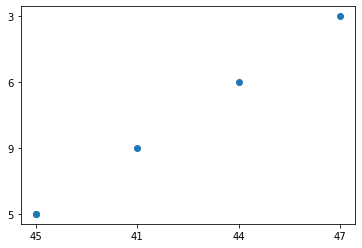

In [246]:
plt.scatter(B['P'], B['C'])
plt.show()

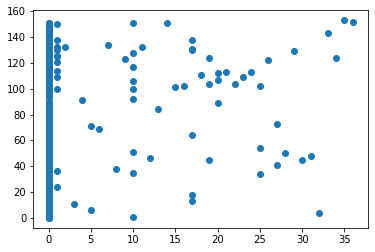

In [247]:
plt.scatter(Data['G'], Data['Tot'])
plt.show()

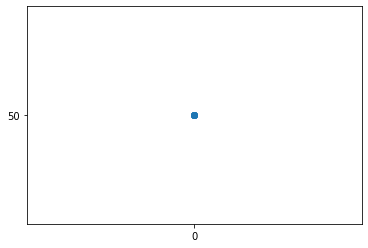

In [248]:
plt.scatter(A['G'], A['Tot'])
plt.show()

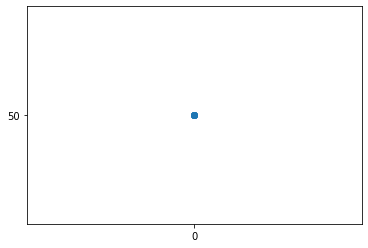

In [249]:
plt.scatter(B['G'], B['Tot'])
plt.show()

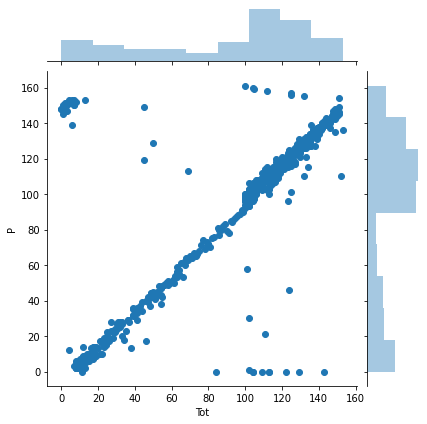

In [250]:
sns.jointplot(x = 'Tot', y ='P', data = Data, kind = 'scatter')

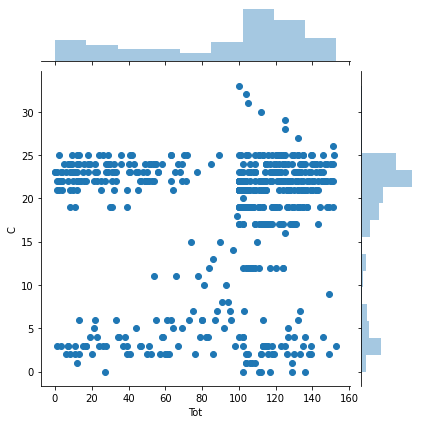

In [251]:
sns.jointplot(x = 'Tot', y ='C', data = Data, kind = 'scatter')

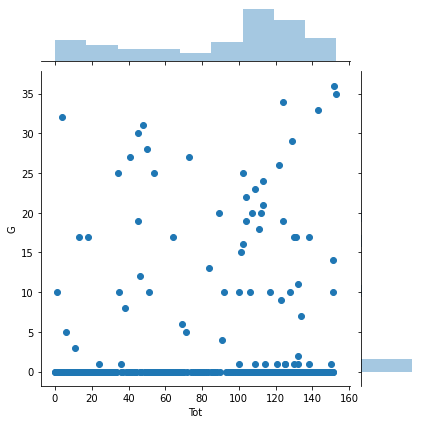

In [252]:
sns.jointplot(x = 'Tot', y ='G', data = Data, kind = 'scatter')

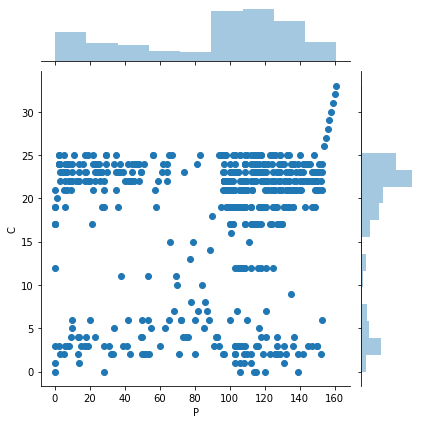

In [253]:
sns.jointplot(x = 'P', y ='C', data = Data, kind = 'scatter')

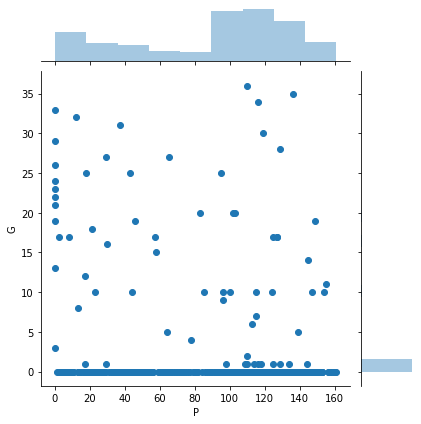

In [254]:
sns.jointplot(x = 'P', y ='G', data = Data, kind = 'scatter')

OBSERVATION: Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).

## STRIP PLOT - BIVARIATE ANALYSIS: It's a graphical data anlysis technique for summarizing a univariate data set. The strip plot consists of: Horizontal axis = the value of the response variable is Categorical/Numerical. It is typically used for small DataFrame (histograms and density plots are typically preferred for larger data sets).

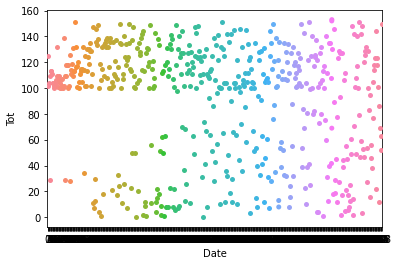

In [160]:
sns.stripplot(x = 'Date\n', y='Tot', data = Data)

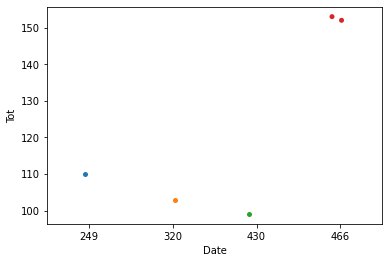

In [161]:
sns.stripplot(x = 'Date\n', y='Tot', data = A)

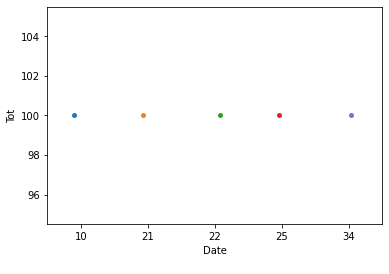

In [162]:
sns.stripplot(x = 'Date\n', y='Tot', data = B)

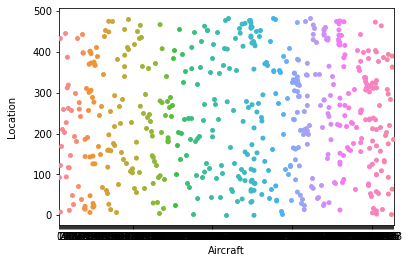

In [163]:
sns.stripplot(x = 'Aircraft\n', y='Location\n', data = Data)

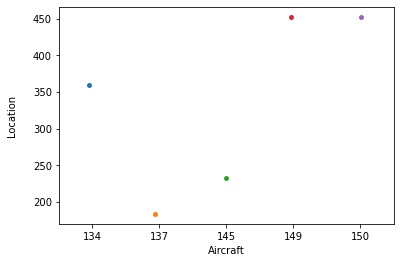

In [164]:
sns.stripplot(x = 'Aircraft\n', y='Location\n', data = A)

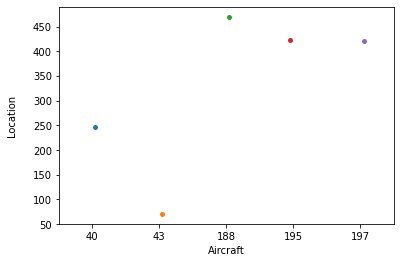

In [165]:
sns.stripplot(x = 'Aircraft\n', y='Location\n', data = B)

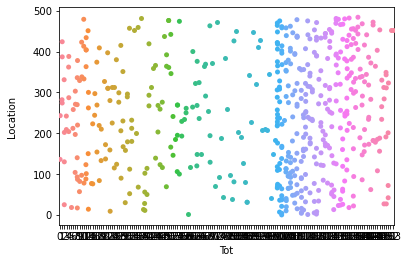

In [166]:
sns.stripplot(x = 'Tot', y='Location\n', data = Data)

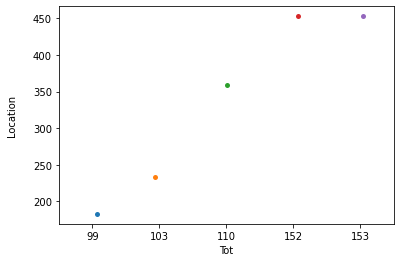

In [167]:
sns.stripplot(x = 'Tot', y='Location\n', data = A)

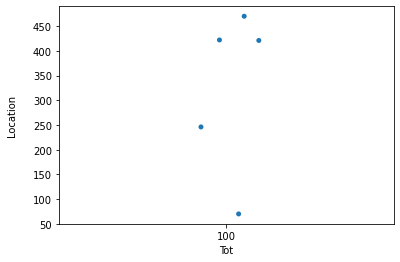

In [168]:
sns.stripplot(x = 'Tot', y='Location\n', data = B)

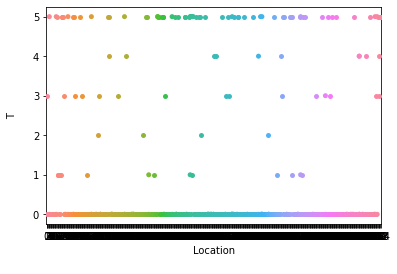

In [169]:
sns.stripplot(x = 'Location\n', y='T\n', data = Data)

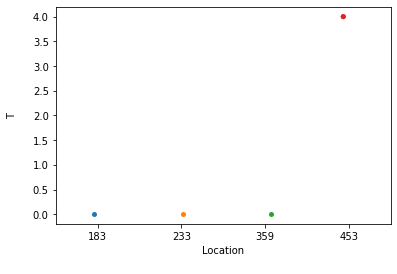

In [170]:
sns.stripplot(x = 'Location\n', y='T\n', data = A)

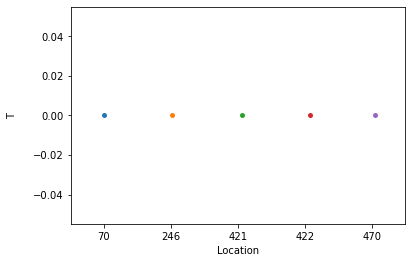

In [171]:
sns.stripplot(x = 'Location\n', y='T\n', data = B)

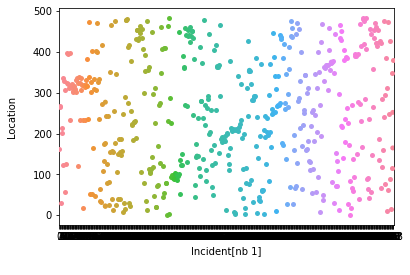

In [172]:
sns.stripplot(x = 'Incident[nb 1]\n', y='Location\n', data = Data)

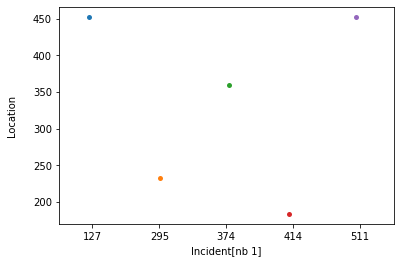

In [173]:
sns.stripplot(x = 'Incident[nb 1]\n', y='Location\n', data = A)

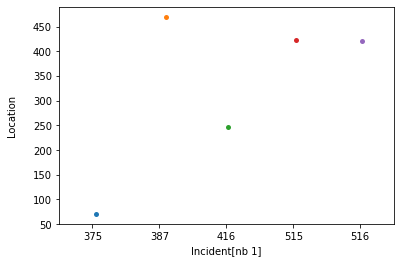

In [174]:
sns.stripplot(x = 'Incident[nb 1]\n', y='Location\n', data = B)

In [175]:
px.strip(Data, x = 'Tot', y='Location\n')

In [176]:
px.strip(A, x = 'Tot', y='Location\n')

In [177]:
px.strip(B, x = 'Tot', y='Location\n')

In [178]:
px.strip(Data, x = 'Date\n', y='Phase\n')

In [179]:
px.strip(A, x = 'Date\n', y='Phase\n')

In [180]:
px.strip(B, x = 'Date\n', y='Phase\n')

In [181]:
px.strip(Data, x = 'Aircraft\n', y='Incident[nb 1]\n')

In [182]:
px.strip(A, x = 'Aircraft\n', y='Incident[nb 1]\n')

In [183]:
px.strip(B, x = 'Aircraft\n', y='Incident[nb 1]\n')

## Categorical Scatterplots - stripplot()

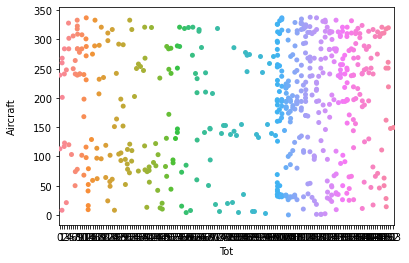

In [263]:
sns.stripplot(data = Data, x = 'Tot', y='Aircraft\n')

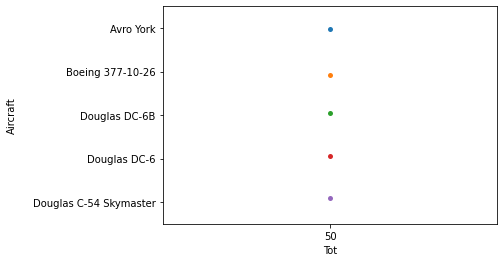

In [264]:
sns.stripplot(data = A, x = 'Tot', y='Aircraft\n')

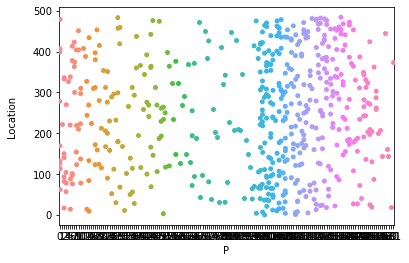

In [265]:
sns.stripplot(data = Data, x = 'P', y='Location\n')

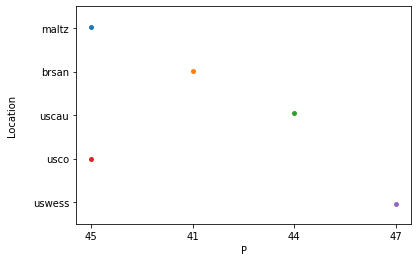

In [266]:
sns.stripplot(data = A, x = 'P', y='Location\n')

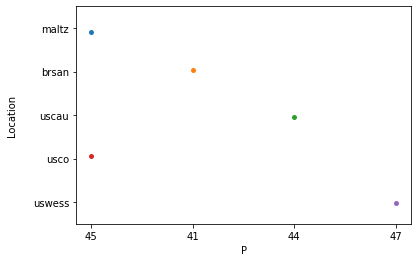

In [267]:
sns.stripplot(data = B, x = 'P', y='Location\n')

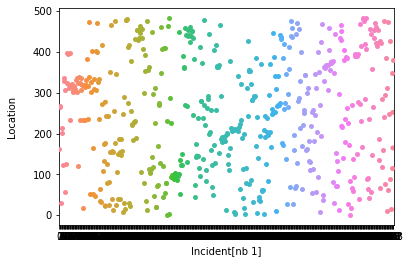

In [268]:
sns.stripplot(data = Data, x = 'Incident[nb 1]\n', y='Location\n')

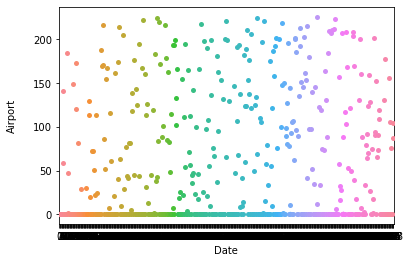

In [273]:
sns.stripplot(data = Data, x = 'Date\n', y='Airport\n')

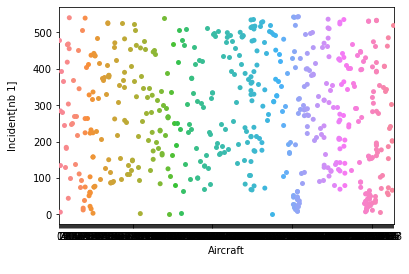

In [272]:
sns.stripplot(data = Data, x = 'Aircraft\n', y='Incident[nb 1]\n')

OBSERVATION: Incident is high with United Airlines Flight 175, Aircraft:- Boeing 767-222: 56 Passengers(P), 9 Crew(C),  1,000 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).

## BAR GRAPH - BIVARIATE ANALYSIS: A bar chart or graph represents categorical data with rectangular bars with heights or lengths proportional to the values that they represent. The bars can be plotted vertically or horizontally. A vertical bar chart is sometimes called a column chart.

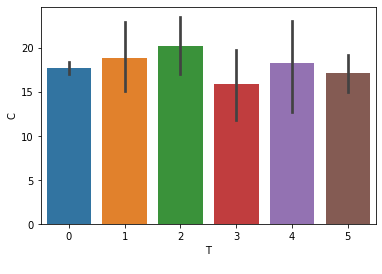

In [184]:
sns.barplot(x='T\n', y='C', data = Data)

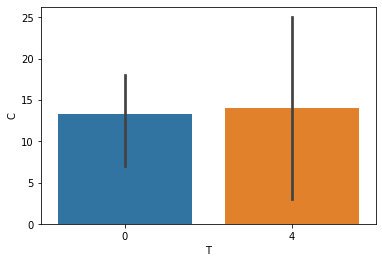

In [185]:
sns.barplot(x='T\n', y='C', data = A)

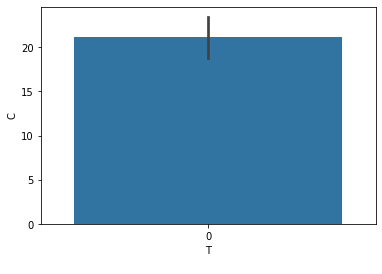

In [186]:
sns.barplot(x='T\n', y='C', data = B)

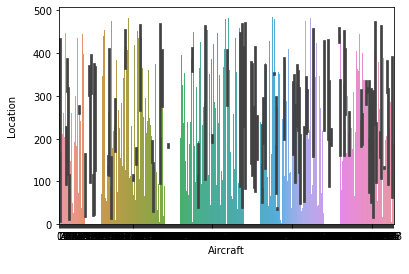

In [187]:
sns.barplot(x='Aircraft\n', y='Location\n', data = Data)

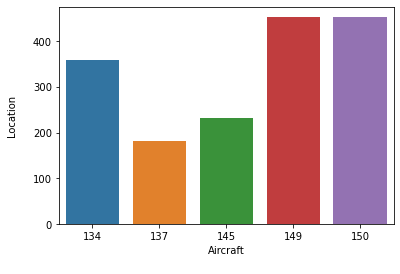

In [188]:
sns.barplot(x='Aircraft\n', y='Location\n', data = A)

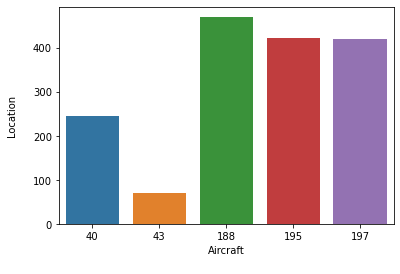

In [189]:
sns.barplot(x='Aircraft\n', y='Location\n', data = B)

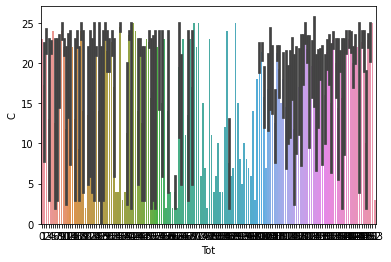

In [190]:
sns.barplot(x = 'Tot', y = 'C', data = Data)

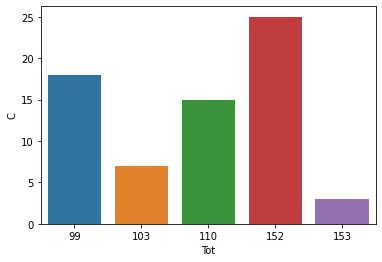

In [191]:
sns.barplot(x = 'Tot', y = 'C', data = A)

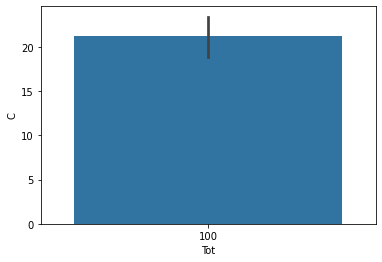

In [192]:
sns.barplot(x = 'Tot', y = 'C', data = B)

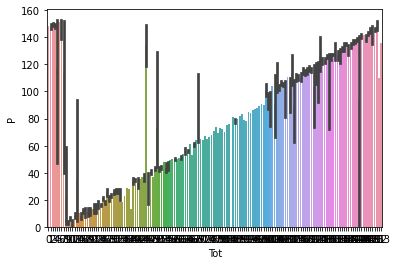

In [193]:
sns.barplot(x = 'Tot', y = 'P', data = Data)

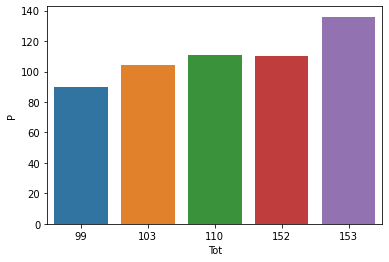

In [194]:
sns.barplot(x = 'Tot', y = 'P', data = A)

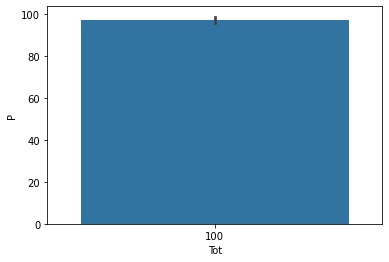

In [195]:
sns.barplot(x = 'Tot', y = 'P', data = B)

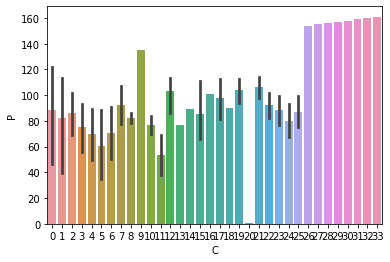

In [196]:
sns.barplot(x = 'C', y = 'P', data = Data)

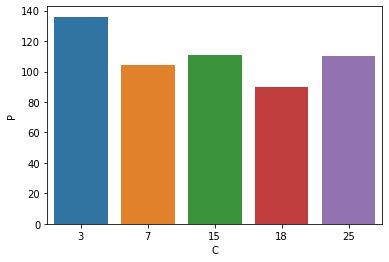

In [197]:
sns.barplot(x = 'C', y = 'P', data = A)

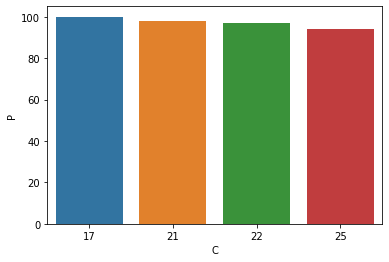

In [198]:
sns.barplot(x = 'C', y = 'P', data = B)

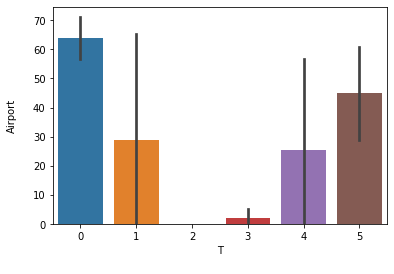

In [199]:
sns.barplot(x = 'T\n', y = 'Airport\n', data = Data)

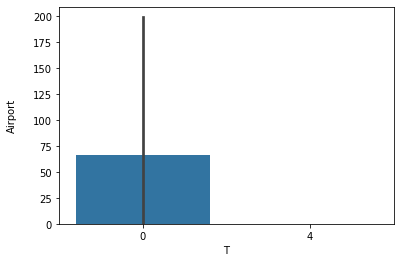

In [200]:
sns.barplot(x = 'T\n', y = 'Airport\n', data = A)

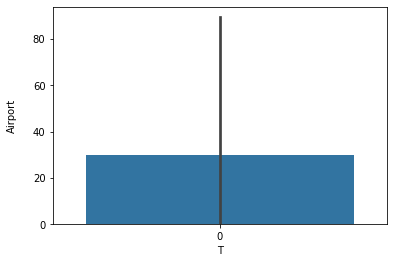

In [201]:
sns.barplot(x = 'T\n', y = 'Airport\n', data = B)

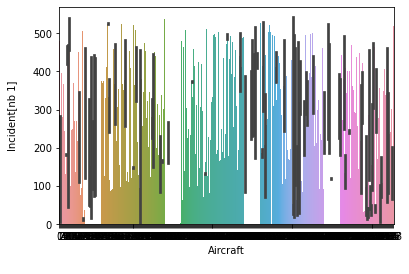

In [202]:
sns.barplot(x = 'Aircraft\n', y = 'Incident[nb 1]\n', data = Data)

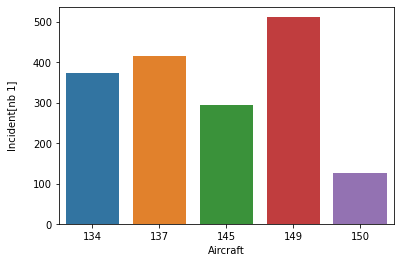

In [203]:
sns.barplot(x = 'Aircraft\n', y = 'Incident[nb 1]\n', data = A)

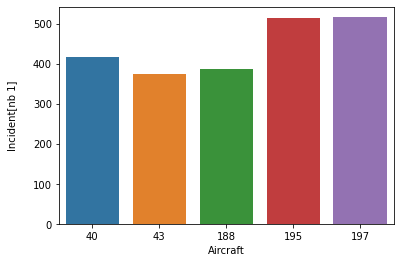

In [204]:
sns.barplot(x = 'Aircraft\n', y = 'Incident[nb 1]\n', data = B)

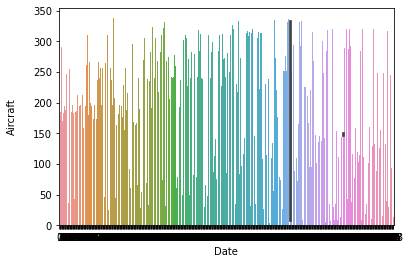

In [205]:
sns.barplot(x = 'Date\n', y = 'Aircraft\n', data = Data)

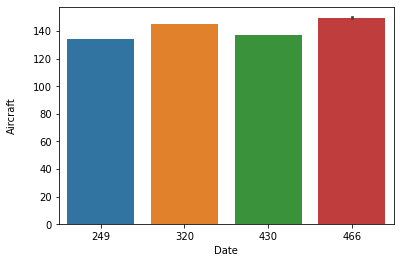

In [206]:
sns.barplot(x = 'Date\n', y = 'Aircraft\n', data = A)

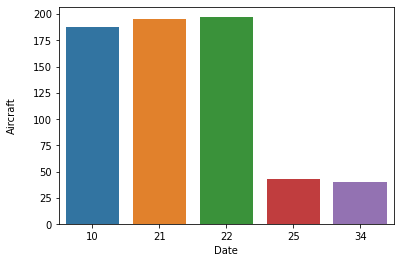

In [207]:
sns.barplot(x = 'Date\n', y = 'Aircraft\n', data = B)

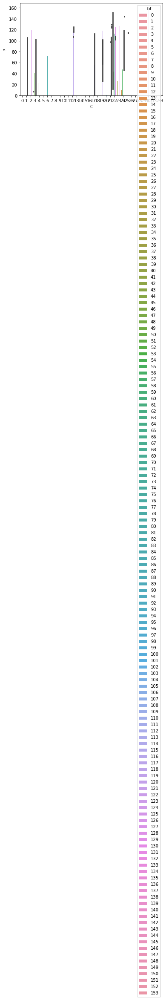

In [208]:
sns.barplot(x = 'C', y = 'P', hue ='Tot', data = Data)

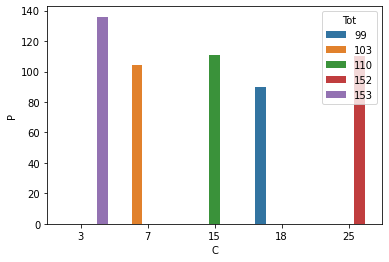

In [209]:
sns.barplot(x = 'C', y = 'P', hue ='Tot', data = A)

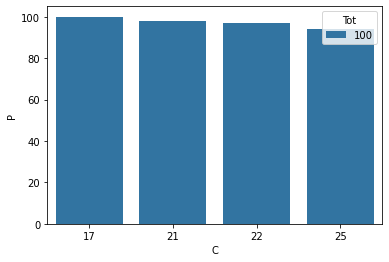

In [210]:
sns.barplot(x = 'C', y = 'P', hue ='Tot', data = B)

OBSERVATIONS: 
1. Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).

2. Incident is high with United Airlines Flight 175, Aircraft:- Boeing 767-222: 56 Passengers(P), 9 Crew(C),  1,000 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).

## PIE CHART: A pie chart (or a circle chart) is a circular statistical graphic, which is divided into slices to illustrate numerical proportion. The arc length of each slice (and consequently its central angle and area), is proportional to the quantity it represents. While it is named for its resemblance to a pie which has been sliced, there are variations on the way it can be presented.

In [211]:
px.pie(Data, names = 'Aircraft\n', values = 'Location\n')

In [213]:
px.pie(A, names = 'Aircraft\n', values = 'Location\n')

In [212]:
px.pie(Data, names = 'Location\n', values = 'Airport\n')

In [215]:
px.pie(A, names = 'Location\n', values = 'Airport\n')

In [216]:
px.pie(Data, names = 'T\n', values = 'Date\n')

In [217]:
px.pie(A, names = 'T\n', values = 'Date\n')

In [218]:
px.pie(Data, names = 'Phase\n', values = 'Date\n')

In [219]:
px.pie(A, names = 'Phase\n', values = 'Date\n')

In [220]:
px.pie(Data, names = 'P', values = 'Incident[nb 1]\n')

In [221]:
px.pie(A, names = 'P', values = 'Incident[nb 1]\n')

In [222]:
px.pie(Data, names = 'T\n', values = 'Phase\n')

In [223]:
px.pie(A, names = 'T\n', values = 'Phase\n')

In [224]:
px.pie(Data, names = 'Tot', values = 'Date\n')

In [225]:
px.pie(A, names = 'Tot', values = 'Date\n')

In [226]:
px.pie(Data, names = 'T\n', values = 'Aircraft\n')

In [227]:
px.pie(A, names = 'T\n', values = 'Aircraft\n')

In [228]:
px.pie(B, names = 'T\n', values = 'Aircraft\n')

In [229]:
px.pie(Data, names = 'T\n', values = 'Airport\n')

In [230]:
px.pie(A, names = 'T\n', values = 'Airport\n')

In [231]:
px.pie(B, names = 'T\n', values = 'Airport\n')

OBSERVATIONS: 
1. Incident is high with Airblue Flight 202, Aircraft:- Airbus A321-231: 146 Passengers(P), 6 Crew(C), were dead by Commercial (T: accident/incident) on Approach(Phase) on 28-7-2010(Date) from a distance of 15km (9.3 mi) at Islamabad, Pakistan APR(Location).

2. Incident is high with Yemenia Flight 626, Aircraft:- Airbus A310-324: 141 Passengers(P), 11 Crew(C), were dead by Commercial (T: accident/incident) on Approach(Phase) on 30-6-2009(Date) from a distance of 40km (25 min) at Mozambique Channel off Mitsamiouli, Comoros(Location).

## HEXBIN PLOT: It represent the relationship of 2 numerical variables when you have a lot of data points. Instead of overlapping, the plotting window is split in several hexbins, and the number of points per hexbin is counted. The color denotes this number of points.

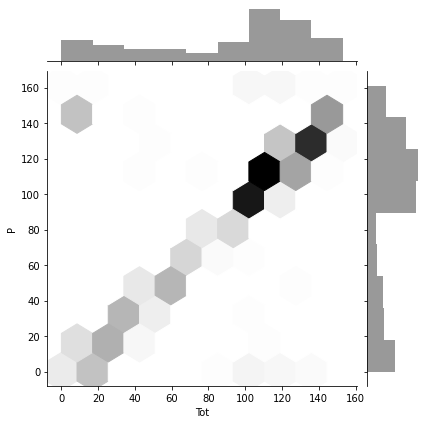

In [255]:
sns.jointplot(x = 'Tot', y = 'P', data = Data, kind='hex', color='k')

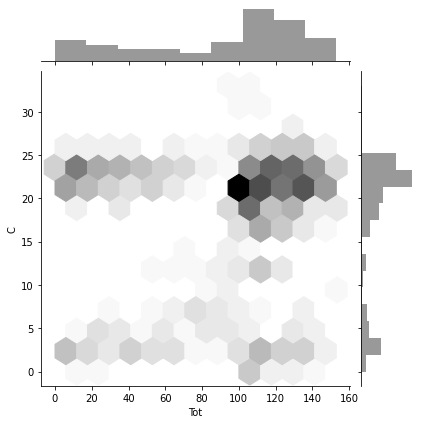

In [256]:
sns.jointplot(x = 'Tot', y = 'C', data = Data, kind='hex', color='k')

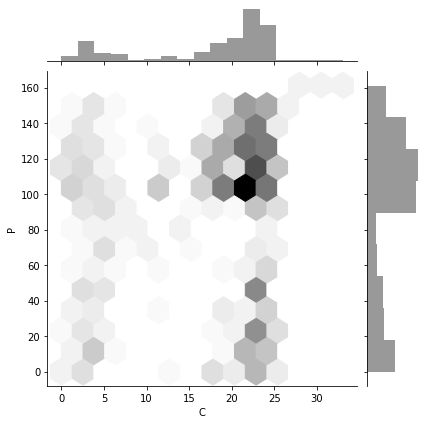

In [257]:
sns.jointplot(x = 'C', y = 'P', data = Data, kind='hex', color='k')

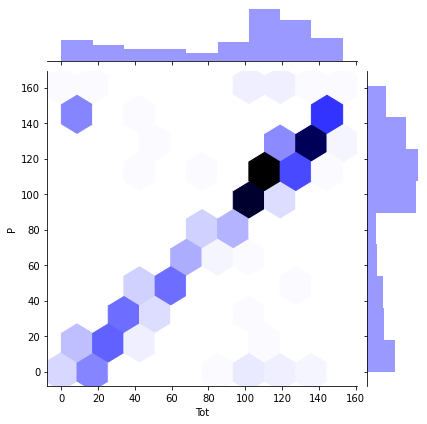

In [258]:
sns.jointplot(x = 'Tot', y = 'P', data = Data, kind='hex', color='b')

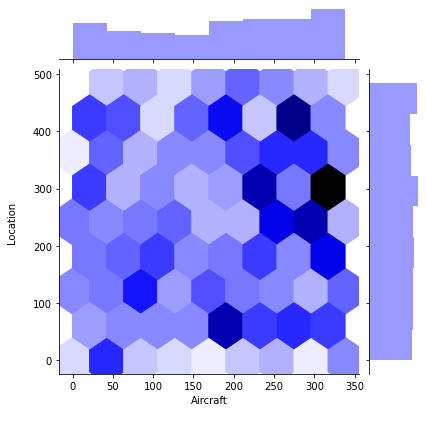

In [259]:
sns.jointplot(x = 'Aircraft\n', y = 'Location\n', data = Data, kind='hex', color='b')

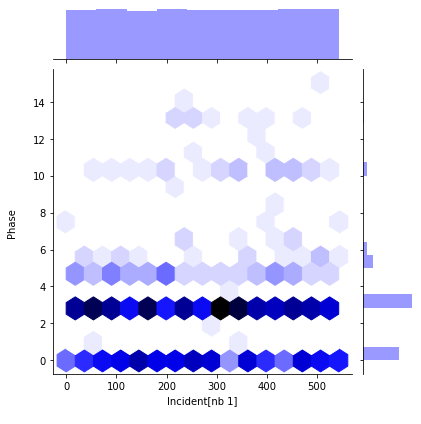

In [260]:
sns.jointplot(x = 'Incident[nb 1]\n', y = 'Phase\n', data = Data, kind='hex', color='b')

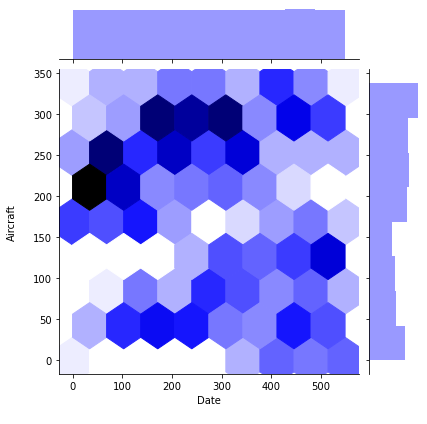

In [262]:
sns.jointplot(x = 'Date\n', y = 'Aircraft\n', data = Data, kind='hex', color='b')

OBSERVATION: Incident is high with Sosoliso Airlines Flight 1145, Aircraft:- McDonnell Douglas DC-9-32: 101 Passengers(P), 7 Crew(C), were dead by Commercial (T: accident/incident) on PHC(Phase) on 10-12-2005(Date) at Port Harcourt, Nigeria, LDG (Location).

## SWARM PLOT: A categorical scatterplot where the points do not overlap. Can be used with other plots to show each observation and it's very similar to a strip plot, yet the locations of points are adjusted automatically to avoid overlap even if the jitter value is not applied. These plots resemble bees swarming.

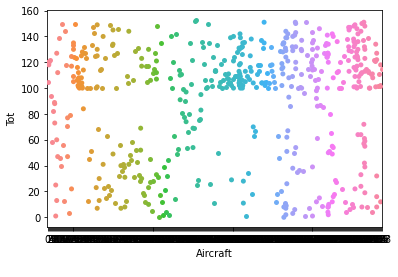

In [275]:
sns.swarmplot(data = Data, x = 'Aircraft\n', y = 'Tot')

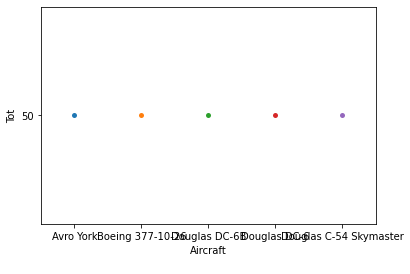

In [276]:
sns.swarmplot(data = A, x = 'Aircraft\n', y = 'Tot')

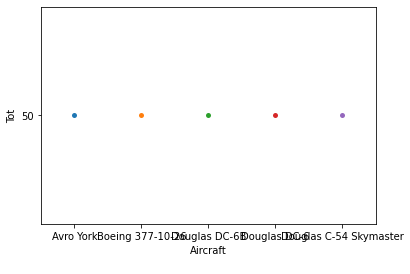

In [277]:
sns.swarmplot(data = B, x = 'Aircraft\n', y = 'Tot')

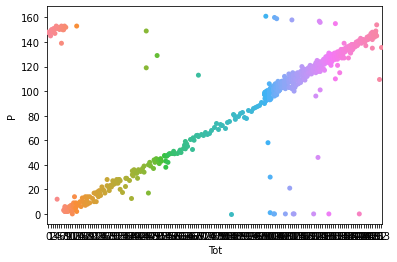

In [278]:
sns.swarmplot(data = Data, x = 'Tot', y = 'P')

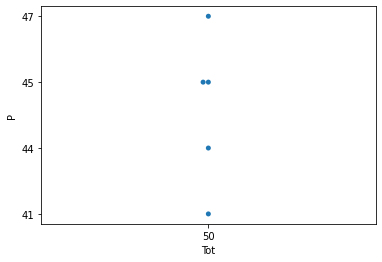

In [279]:
sns.swarmplot(data = A, x = 'Tot', y = 'P')

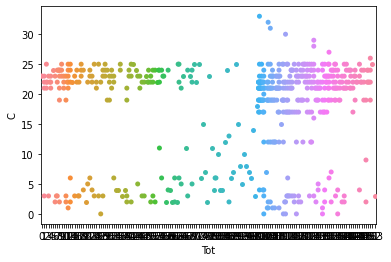

In [280]:
sns.swarmplot(data = Data, x = 'Tot', y = 'C')

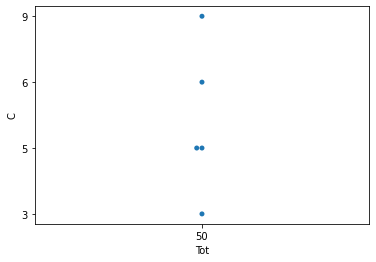

In [281]:
sns.swarmplot(data = A, x = 'Tot', y = 'C')

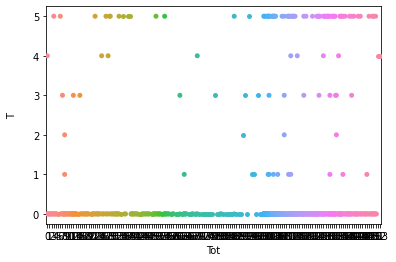

In [282]:
sns.swarmplot(data = Data, x = 'Tot', y = 'T\n')

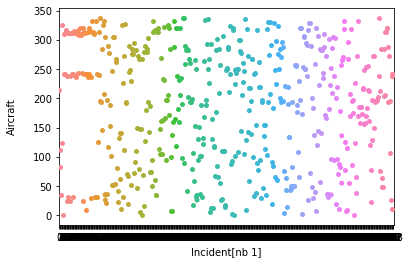

In [283]:
sns.swarmplot(data = Data, x = 'Incident[nb 1]\n', y = 'Aircraft\n')

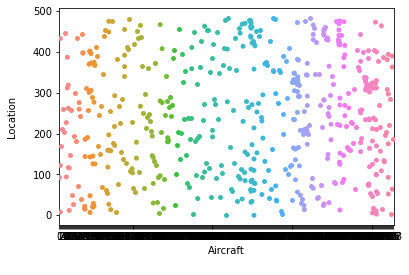

In [285]:
sns.swarmplot(data = Data, x = 'Aircraft\n', y = 'Location\n')

In [ ]:
sns.catplot(x="Tot", y="P", hue="C", kind="swarm", data=A)

In [ ]:
sns.catplot(x="Tot", y="P", hue="C", kind="swarm", data=B)

In [ ]:
sns.catplot(x="Date\n", y="P", hue="C", kind="swarm", data=A)

In [ ]:
sns.catplot(x="Date\n", y="P", hue="C", kind="swarm", data=B)

OBSERVATION: Incident is high with Cebu Pacific Air Flight 387, Aircraft:- McDonnell Douglas DC-9-32: 99 Passengers(P), 5 Crew(C), were dead by Commercial (T: accident/incident) on En Route(Phase) on 02-2-1998(Date) at Mount Balatukan, Philippines(Location).	

## COUNT PLOT: It can be thought of as a histogram across a categorical, instead of quantitative, variable. The basic API and options are identical to those for barplot() , so we can compare counts across nested variables.

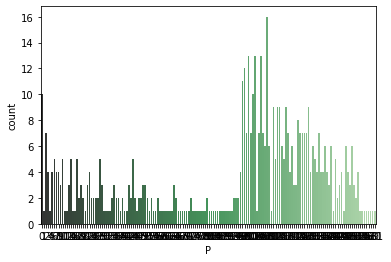

In [287]:
sns.countplot(x = 'P', data = Data, palette ='Greens_d')

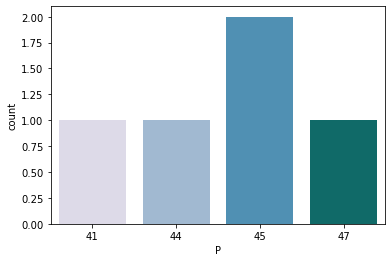

In [288]:
sns.countplot(x = 'P', data = A, palette ='PuBuGn')

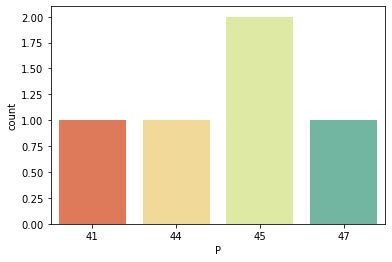

In [289]:
sns.countplot(x = 'P', data = B, palette ='Spectral')

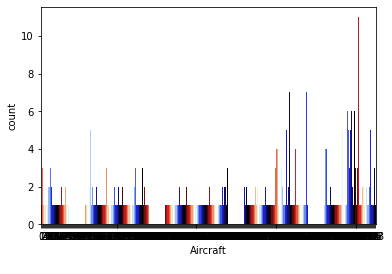

In [290]:
sns.countplot(x = 'Aircraft\n', data = Data, palette ='flag')

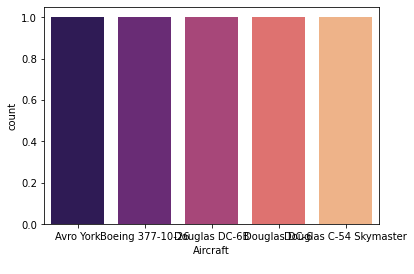

In [291]:
sns.countplot(x = 'Aircraft\n', data = A, palette ='magma')

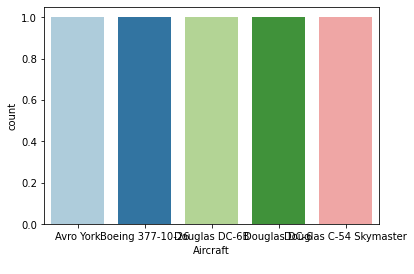

In [292]:
sns.countplot(x = 'Aircraft\n', data = B, palette ='Paired')

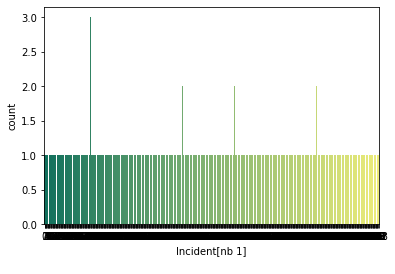

In [293]:
sns.countplot(x = 'Incident[nb 1]\n', data = Data, palette ='summer')

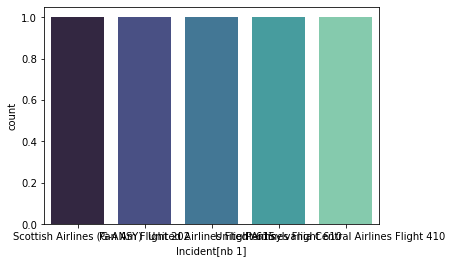

In [294]:
sns.countplot(x = 'Incident[nb 1]\n', data = A, palette ='mako')

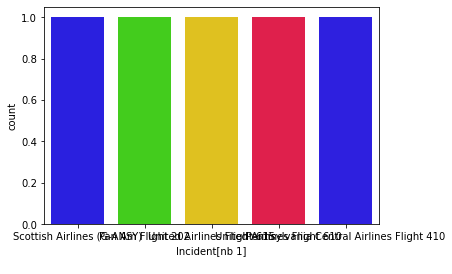

In [295]:
sns.countplot(x = 'Incident[nb 1]\n', data = B, palette ='prism')

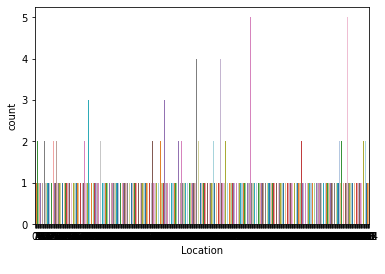

In [296]:
sns.countplot(x = 'Location\n', data = Data, palette='tab20')

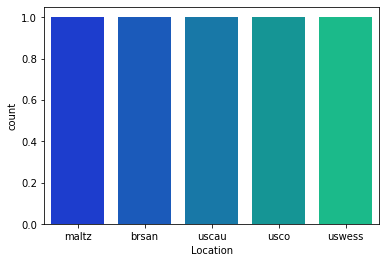

In [297]:
sns.countplot(x = 'Location\n', data = A, palette='winter')

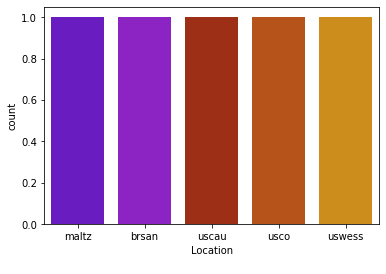

In [298]:
sns.countplot(x = 'Location\n', data = B, palette='gnuplot')

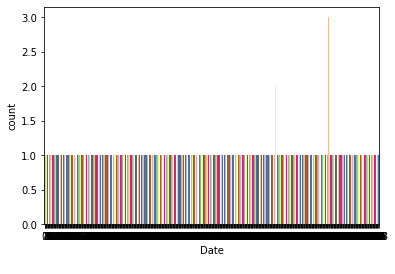

In [299]:
sns.countplot(x = 'Date\n', data = Data, palette='Accent')

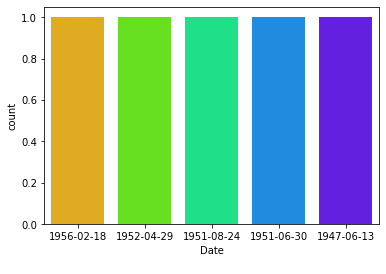

In [300]:
sns.countplot(x = 'Date\n', data = A, palette='gist_rainbow')

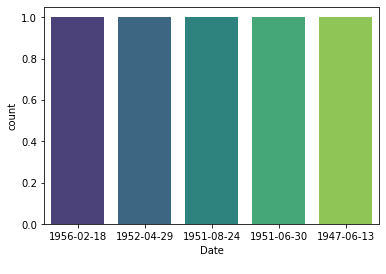

In [301]:
sns.countplot(x = 'Date\n', data = B, palette='viridis')

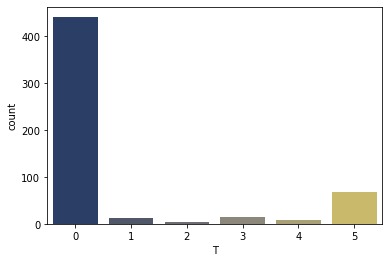

In [302]:
sns.countplot(x = 'T\n', data = Data, palette='cividis')

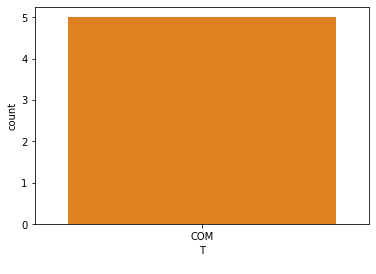

In [303]:
sns.countplot(x = 'T\n', data = A, palette='afmhot')

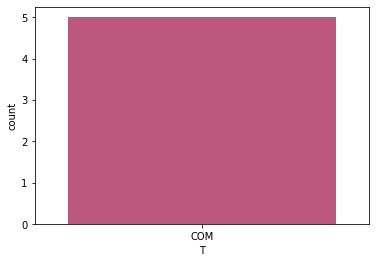

In [304]:
sns.countplot(x = 'T\n', data = B, palette='plasma')

OBSERVATION: Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).	

## CORRELATION BETWEEN DIFFERENT VARIABLES

Index(['Tot', 'C', 'P', 'G', 'N', 'T\n', 'Incident[nb 1]\n', 'Aircraft\n',
       'Location\n', 'Phase\n', 'Airport\n', 'Distance\n', 'Date\n'],
      dtype='object')

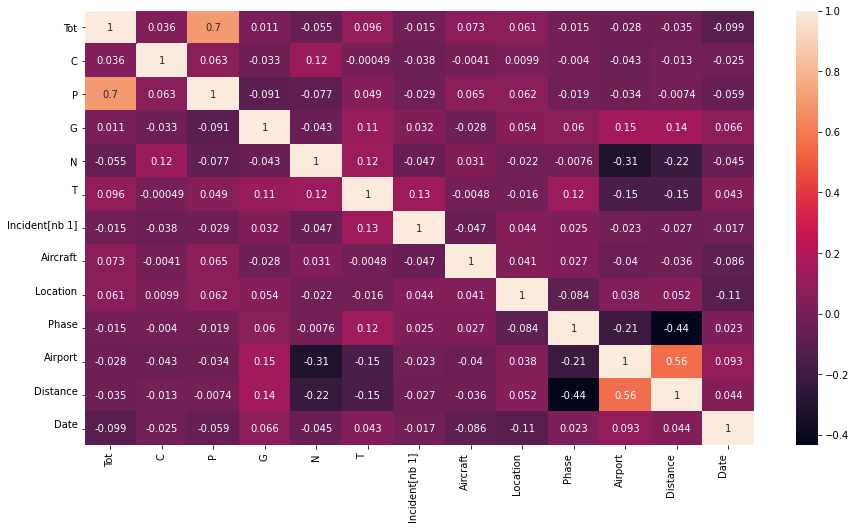

In [305]:
corr = Data.corr(method='kendall')
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)
Data.columns

## POINT PLOT: In seaborn, Point plot means a scatter plot depicting point estimations for categories with defined confidence intervals.The point plot also draws error lines (also called as bars or glyphs) that are extended from the points to desrcibe the dispersion or uncertainty of the point estimate.

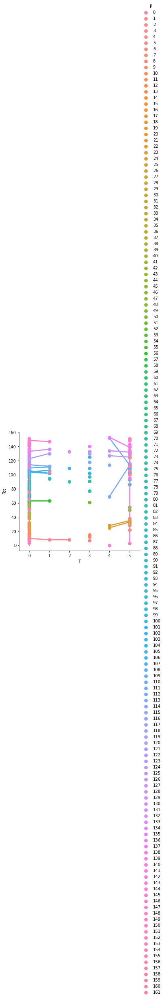

In [308]:
sns.catplot(x = "T\n", y = "Tot", hue = "P", kind = "point", data = Data)

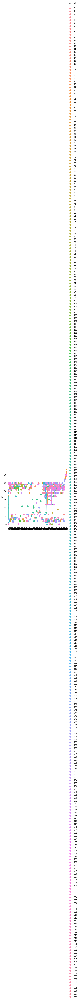

In [310]:
sns.catplot(x = "P", y = "C", hue = "Aircraft\n", kind = "point", data = Data)

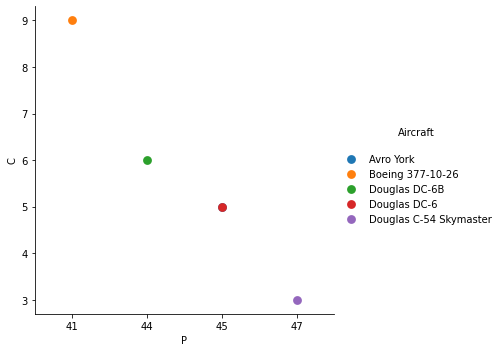

In [311]:
sns.catplot(x = "P", y = "C", hue = "Aircraft\n", kind = "point", data = A)

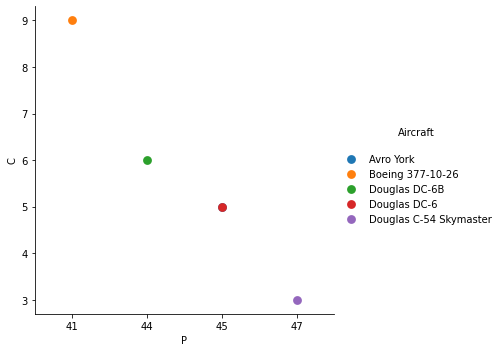

In [312]:
sns.catplot(x = "P", y = "C", hue = "Aircraft\n", kind = "point", data = B)

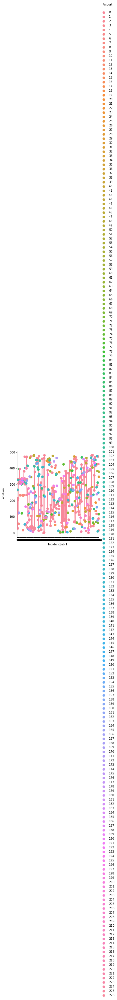

In [313]:
sns.catplot(x = "Incident[nb 1]\n", y = "Location\n", hue = "Airport\n", kind = "point", data = Data)

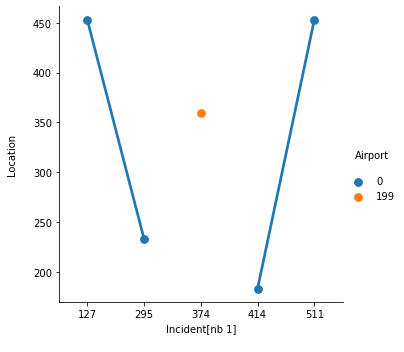

In [315]:
A = Data.head()
sns.catplot(x = "Incident[nb 1]\n", y = "Location\n", hue = "Airport\n", kind = "point", data = A)

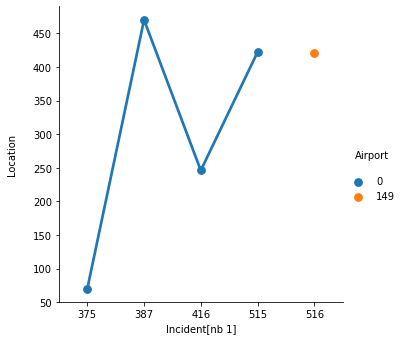

In [316]:
B = Data.tail()
sns.catplot(x = "Incident[nb 1]\n", y = "Location\n", hue = "Airport\n", kind = "point", data = B)

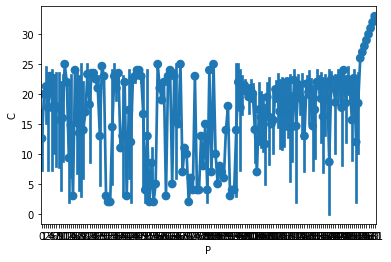

In [317]:
ax = sns.pointplot(x = "P", y = "C", data = Data)

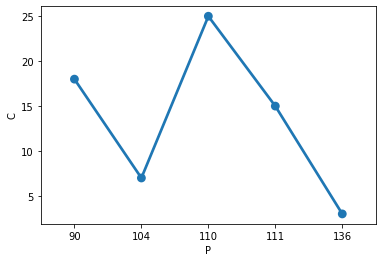

In [318]:
ax = sns.pointplot(x = "P", y="C", data = A)

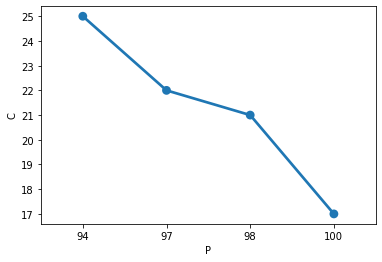

In [319]:
ax = sns.pointplot(x = "P", y="C", data = B)

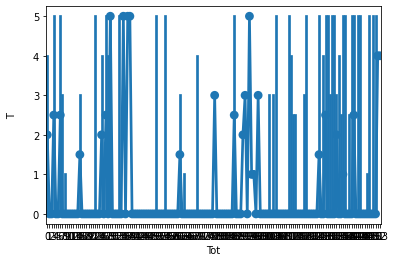

In [320]:
ax = sns.pointplot(x = "Tot", y = "T\n", data = Data, estimator = median)

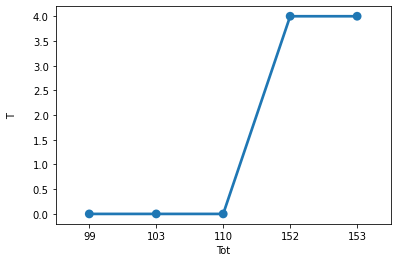

In [321]:
ax = sns.pointplot(x = "Tot", y = "T\n", data = A, estimator = median)

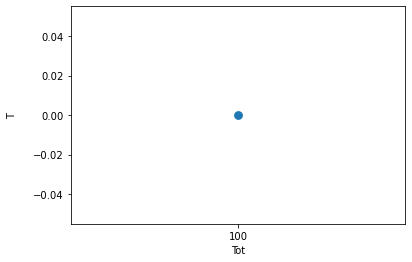

In [322]:
ax = sns.pointplot(x = "Tot", y = "T\n", data = B, estimator = median)

IndexError: list index out of range

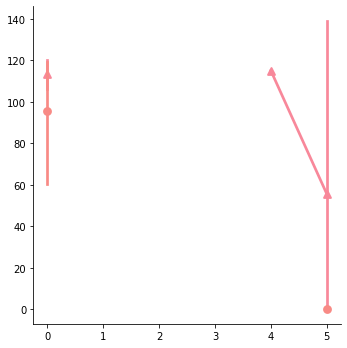

In [323]:
sns.catplot(x = "T\n", y = "P", hue = "C", markers=["^", "o"], linestyles=["-", "--"], kind="point", data = Data)

IndexError: list index out of range

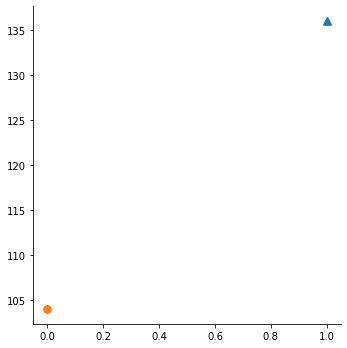

In [324]:
sns.catplot(x = "T\n", y = "P", hue = "C", markers=["^", "o"], linestyles=["-", "--"], kind="point", data = A)

IndexError: list index out of range

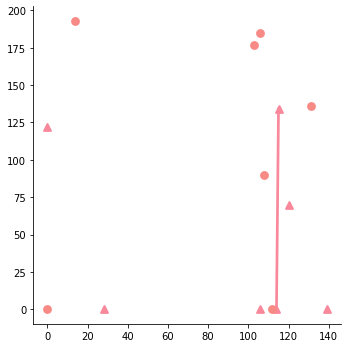

In [325]:
sns.catplot(x = "P", y = "Airport\n", hue = "C", markers=["^", "o"], linestyles=["-", "--"], kind="point", data = Data)

IndexError: list index out of range

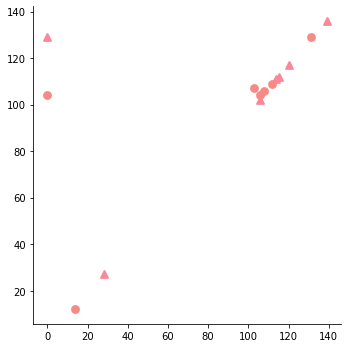

In [326]:
sns.catplot(x = "P", y = "Tot", hue = "C", markers=["^", "o"], linestyles=["-", "--"], kind="point", data = Data)

OBSERVATION: Incident is high with American Airlines Flight 11, Aircraft:- Boeing 767-223ER: 81 Passengers(P), 11 Crew(C),  1,700 Estimation were dead by Hijacking (T: INH) on En Route(Phase) on 11-9-2001(Date) at New York City, New York, U.S (Location).	

## VIOLIN PLOT: A combination of boxplot and kernel density estimation, plays a similar role as a box and whisker plot. It shows the distribution of quantitative data across several levels of one (or more) categorical variables such that those distributions can be compared.

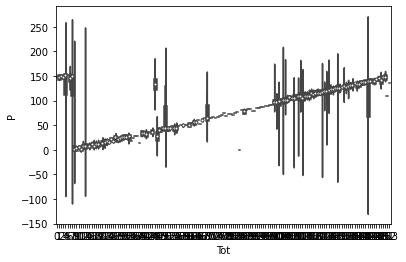

In [327]:
sns.violinplot(x = Data.Tot, y = Data.P)

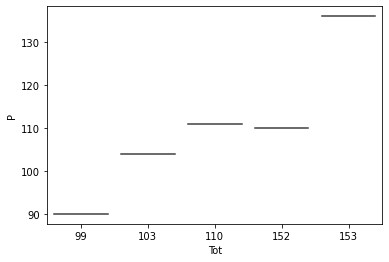

In [328]:
sns.violinplot(x = A.Tot, y = A.P)

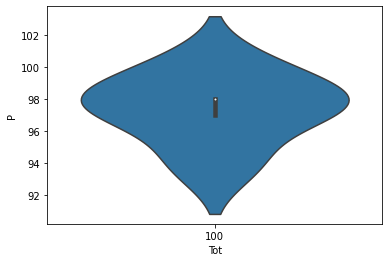

In [329]:
sns.violinplot(x = B.Tot, y = B.P)

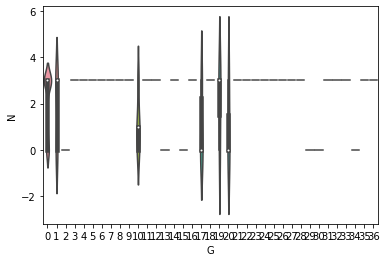

In [330]:
sns.violinplot(x = Data.G, y = Data.N)

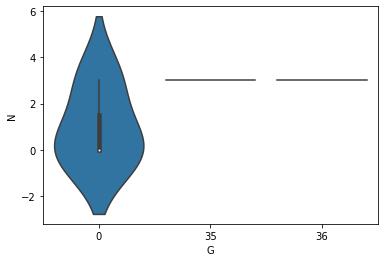

In [331]:
sns.violinplot(x = A.G, y = A.N)

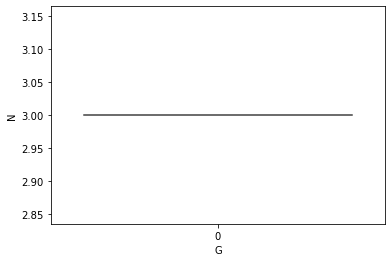

In [332]:
sns.violinplot(x = B.G, y = B.N)

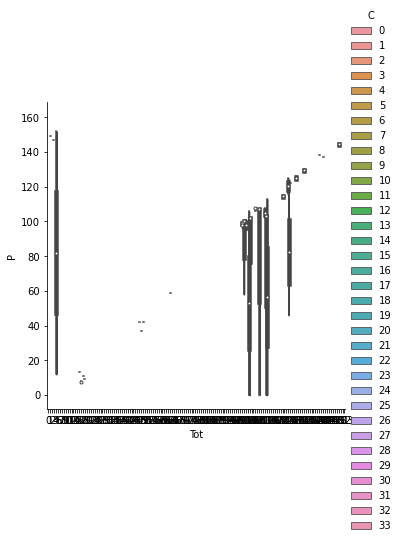

In [333]:
sns.catplot(x="Tot", y="P", hue="C",kind="violin", bw=.15, cut=0, data=Data)

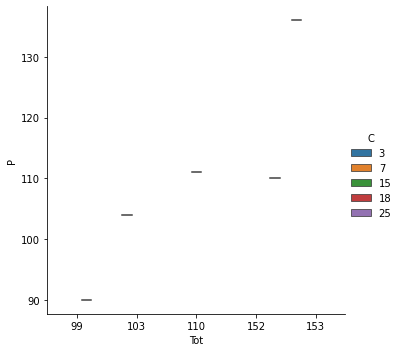

In [334]:
sns.catplot(x="Tot", y="P", hue="C",kind="violin", bw=.15, cut=0, data=A)

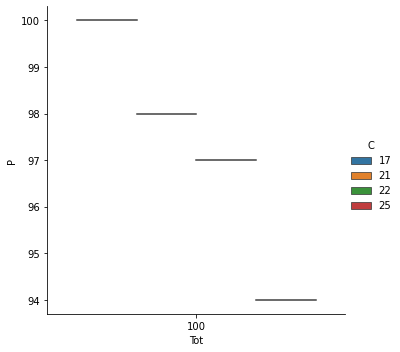

In [335]:
sns.catplot(x="Tot", y="P", hue="C",kind="violin", bw=.15, cut=0, data=B)

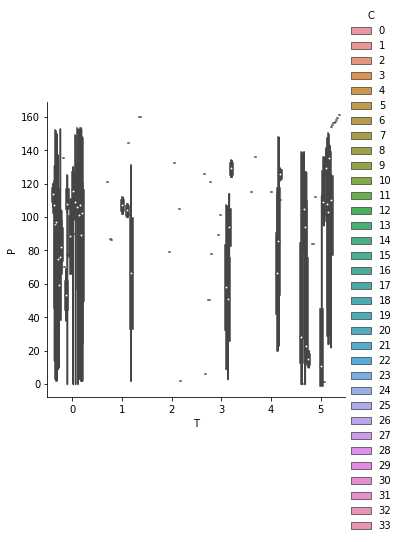

In [336]:
sns.catplot(x="T\n", y="P", hue="C",kind="violin", bw=.15, cut=0, data=Data)

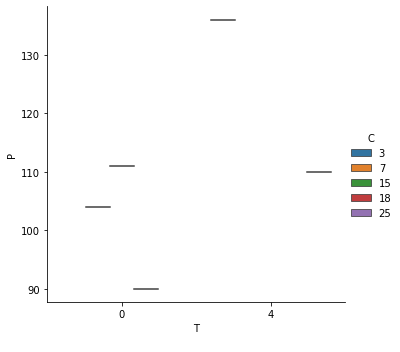

In [337]:
sns.catplot(x="T\n", y="P", hue="C",kind="violin", bw=.15, cut=0, data=A)

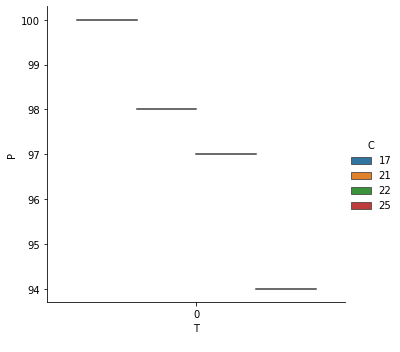

In [338]:
sns.catplot(x="T\n", y="P", hue="C",kind="violin", bw=.15, cut=0, data=B)

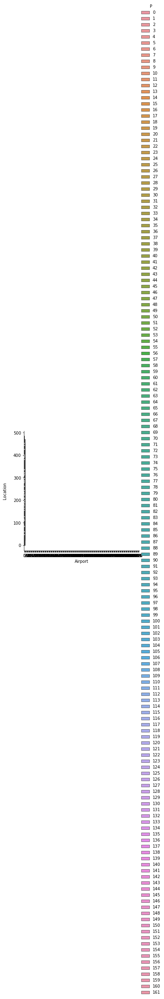

In [339]:
sns.catplot(x = "Airport\n", y = "Location\n", hue = "P", kind = "violin", bw = .15, cut = 0, data = Data)

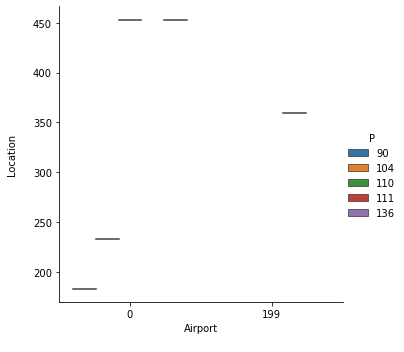

In [340]:
sns.catplot(x = "Airport\n", y = "Location\n", hue = "P", kind = "violin", bw = .15, cut = 0, data = A)

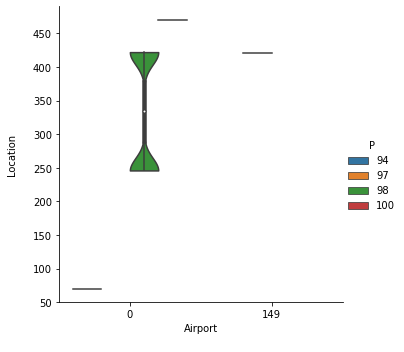

In [341]:
sns.catplot(x = "Airport\n", y = "Location\n", hue = "P", kind = "violin", bw = .15, cut = 0, data = B)

OBSERVATION: Incident is high with Airblue Flight 202, Aircraft:- Airbus A321-231: 146 Passengers(P), 6 Crew(C), were dead by Commercial (T: COM - accident/incident) on Approach(Phase) from 15km (9.3 mi) on 28-7-2010(Date) at Islamabad, Pakistan (Location).

## BOXEN PLOT: It is similar to a box plot in plotting a nonparametric representation of a distribution in which all features correspond to actual observations. By plotting more quantiles, it provides more information about the shape of the distribution, particularly in the tails. Syntax : seaborn.boxenplot(parameters)

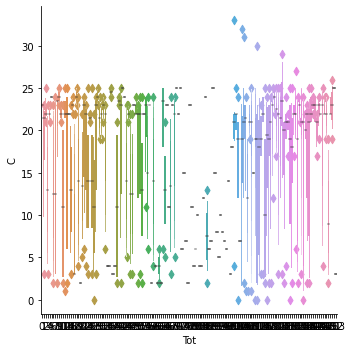

In [342]:
sns.catplot(x = "Tot", y = "C", kind="boxen", data = Data.sort_values("P"))

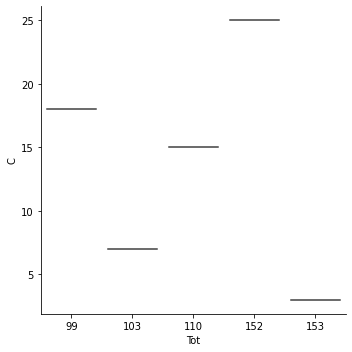

In [343]:
sns.catplot(x = "Tot", y = "C", kind="boxen", data = A.sort_values("P"))

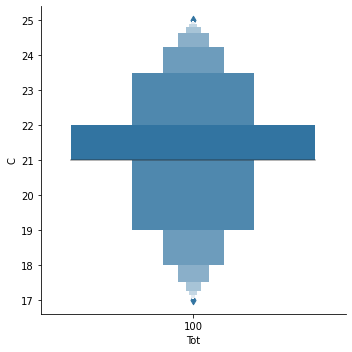

In [344]:
sns.catplot(x = "Tot", y = "C", kind="boxen", data = B.sort_values("P"))

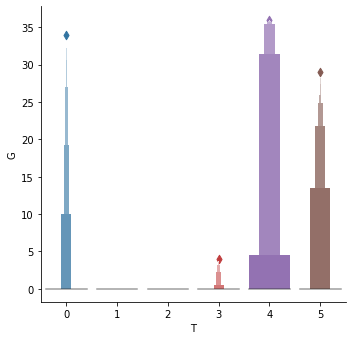

In [345]:
sns.catplot(x = "T\n", y = "G", kind = "boxen", data = Data.sort_values("N"))

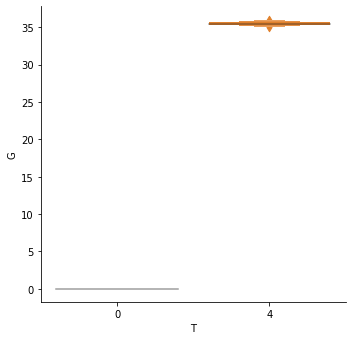

In [346]:
sns.catplot(x = "T\n", y = "G", kind = "boxen", data = A.sort_values("N"))

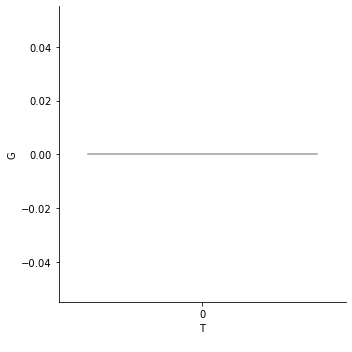

In [347]:
sns.catplot(x = "T\n", y = "G", kind = "boxen", data = B.sort_values("N"))

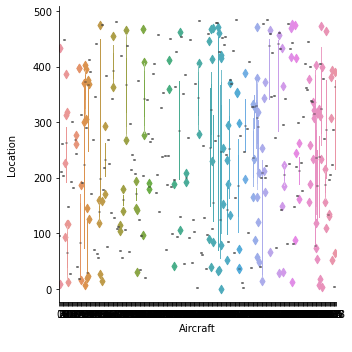

In [348]:
sns.catplot(x = "Aircraft\n", y = "Location\n", kind = "boxen", data = Data.sort_values("Date\n"))

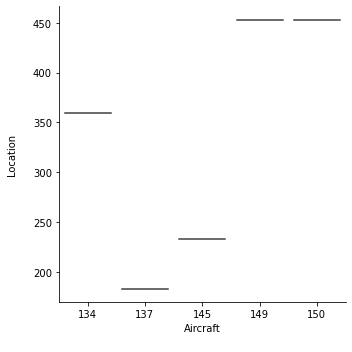

In [349]:
sns.catplot(x = "Aircraft\n", y = "Location\n", kind = "boxen", data = A.sort_values("Date\n"))

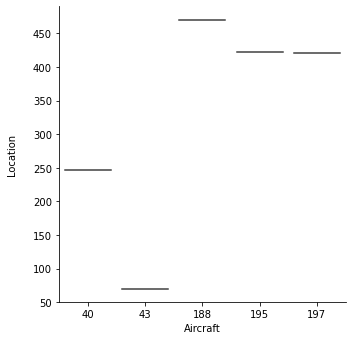

In [350]:
sns.catplot(x = "Aircraft\n", y = "Location\n", kind = "boxen", data = B.sort_values("Date\n"))

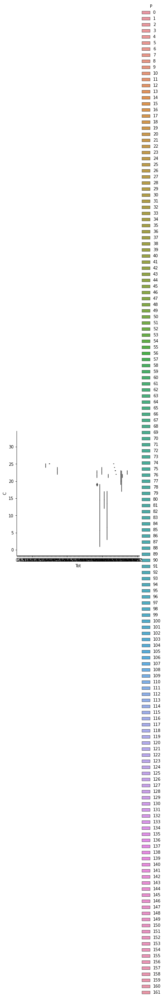

In [351]:
sns.catplot(x = "Tot", y = "C", hue = "P", kind = "box", data = Data)

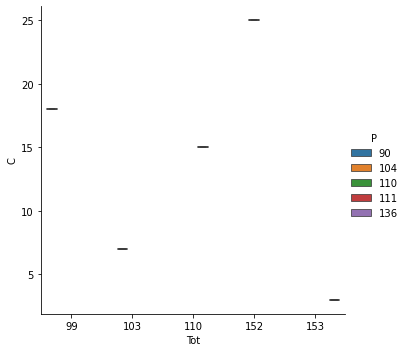

In [352]:
sns.catplot(x = "Tot", y = "C", hue = "P", kind = "box", data = A)

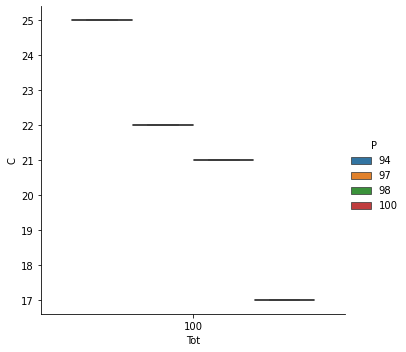

In [353]:
sns.catplot(x = "Tot", y = "C", hue = "P", kind = "box", data = B)

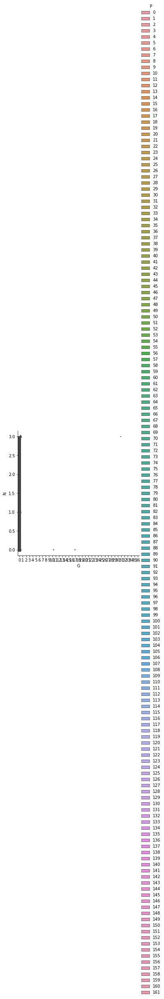

In [354]:
sns.catplot(x = "G", y = "N", hue = "P", kind = "box", data = Data)

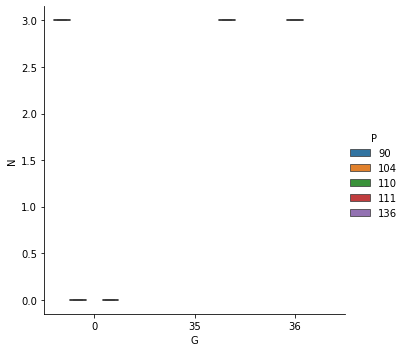

In [355]:
sns.catplot(x = "G", y = "N", hue = "P", kind = "box", data = A)

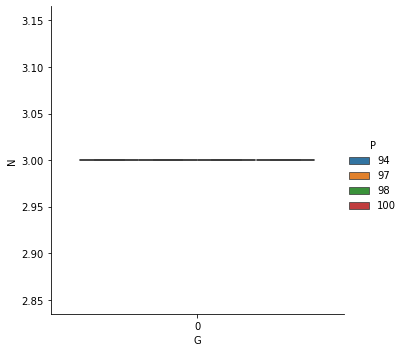

In [356]:
sns.catplot(x = "G", y = "N", hue = "P", kind = "box", data = B)

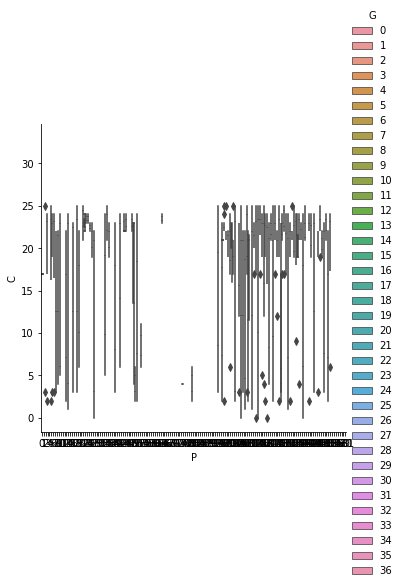

In [357]:
sns.catplot(x = "P", y = "C", hue = "G", kind = "box", data = Data)

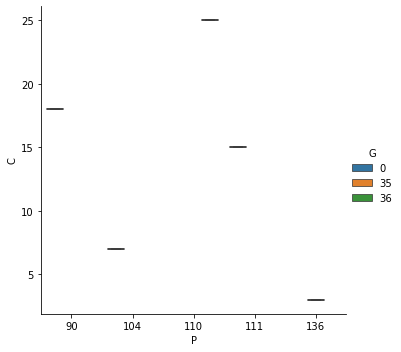

In [358]:
sns.catplot(x = "P", y = "C", hue = "G", kind = "box", data = A)

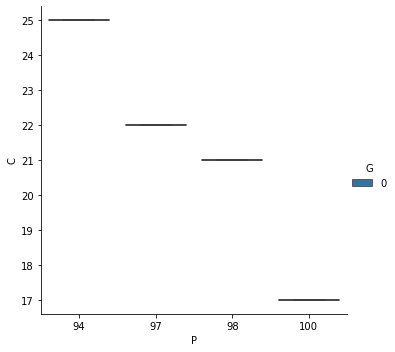

In [359]:
sns.catplot(x = "P", y = "C", hue = "G", kind = "box", data = B)

OBSERVATION: Incident is high with Iranian Air Force (5-8519), Aircraft:- Lockheed C-130E Hercules: 84 Passengers(P), 10 Crew(C), were dead by Military (T:MIL - accident/incident) on Approach(Phase) of 5.5 km (3.4 mi) on 06-12-2005(Date) at Tehran, Iran(Location).

## PAIR PLOT: It's a pairwise relationships in a dataset. The pairplot function creates a grid of Axes such that each variable in data will by shared in the y-axis across a single row and in the x-axis across a single column.

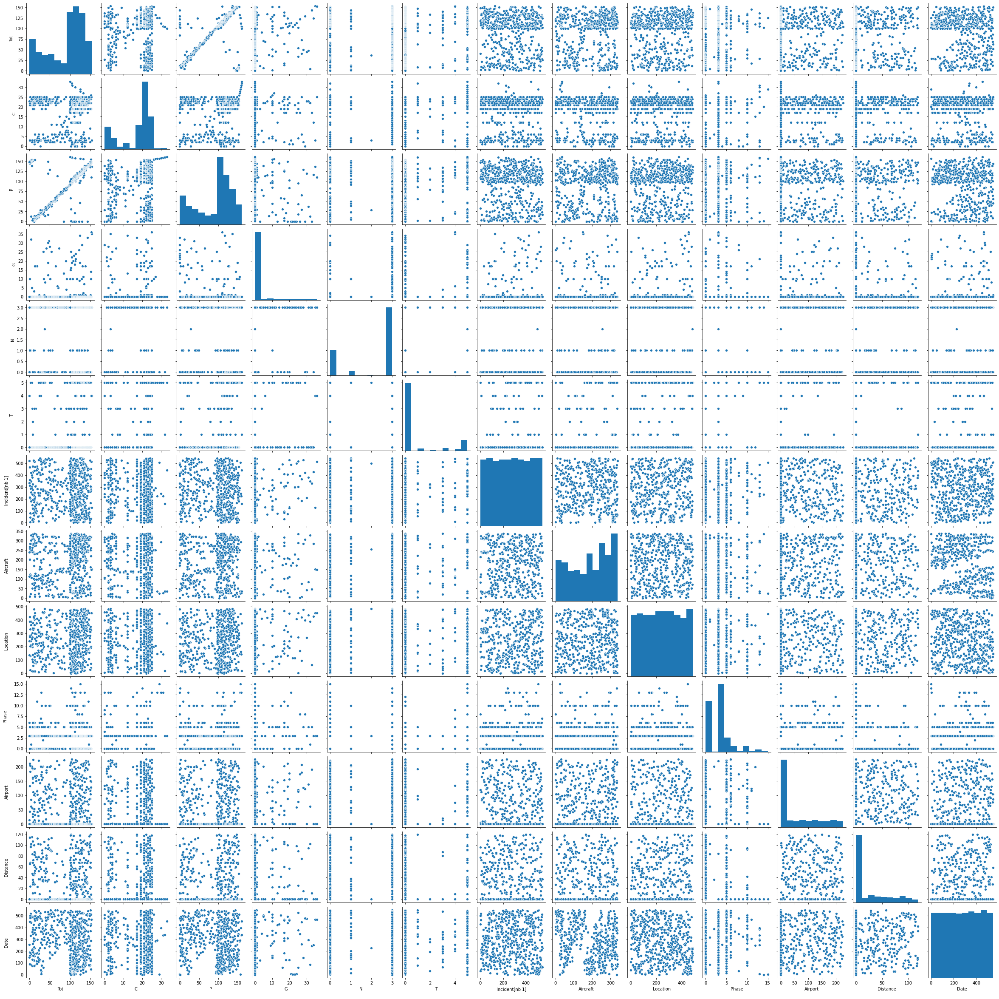

In [360]:
sns.pairplot(Data)